# Setup and Loading Packages

In [1]:
# ==============================================================================
# SECTION 1: LOAD PRE-COMPUTED SLINGSHOT RESULTS
# ==============================================================================
# Load previously computed lineages and curves from CMO analysis

lineages <- readRDS('./lineages_cmo.rds')
curves <- readRDS('./curves_cmo.rds')

In [2]:
# https://nbisweden.github.io/workshop-scRNAseq/labs/seurat/seurat_07_trajectory.html

In [3]:
# ==============================================================================
# Environment Setup
# ==============================================================================

source("/home/ridvan/scRIPT/settings.R")
source("/home/ridvan/scRIPT/utils.R")

In [4]:
# ==============================================================================
# Configure Parallel Processing
# ==============================================================================
# 20-25 workers, 250GB RAM allocation

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 20

# Multi core using future - built in to seurat
plan("multicore", workers = 25)
options(future.globals.maxSize = 250 * 1024 ^ 3) # for 250 Gb RAM

getwd()

[1] "/home/ridvan/PhD_Projects/CMO/Bioinformatic_Analysis/step13_pseudotime/slingshot_cmo"

In [5]:
# ==============================================================================
# SECTION 2: LOAD PACKAGES
# ==============================================================================
# Seurat, slingshot, tradeSeq for trajectory analysis

suppressPackageStartupMessages({
  library(Seurat)
  library(plotly)
  options(rgl.printRglwidget = TRUE)
  library(Matrix)
  library(sparseMatrixStats)
  library(slingshot)
  library(tradeSeq)
  library(patchwork)
})


In [6]:
# ==============================================================================
# SECTION 3: LOAD CMO SEURAT OBJECT
# ==============================================================================
# 71,107 cells with 6 dimensional reductions

obj <- readRDS('../../../cmo_version3.rds')
obj

An object of class Seurat 
27998 features across 71107 samples within 1 assay 
Active assay: RNA (27998 features, 0 variable features)
 2 layers present: counts, data
 6 dimensional reductions calculated: OLDPCA, OLDUMAP, OLDTSNE, PCA, UMAP, UMAP3D

In [8]:
# ==============================================================================
# Load Custom Slingshot Utility Functions
# ==============================================================================

source("./slingshot_utils.R")

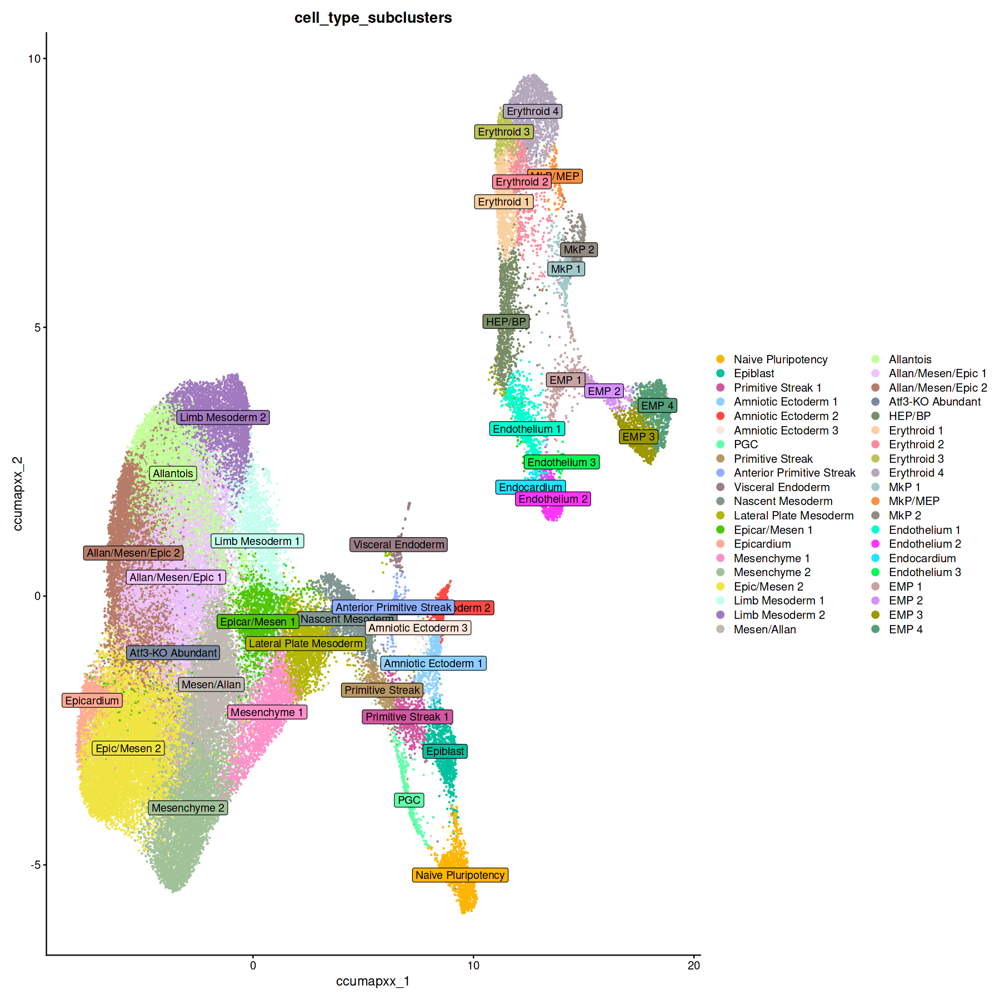

In [12]:
# ==============================================================================
# Visualize UMAP with Cell Types
# ==============================================================================

# Set plot size
options(repr.plot.width = 15, repr.plot.height = 15)
DimPlot(obj, reduction = 'UMAP', cols = r3dcol$cols_46, group.by = "cell_type_subclusters", label= TRUE, label.box = TRUE)

In [ ]:
df <- data.frame(obj@reductions$UMAP3D@cell.embeddings, variable = factor(obj$cell_type_subclusters))
colnames(df)[1:3] <- c("UMAP_1", "UMAP_2", "UMAP_3")
p_State <- plot_ly(df, x = ~UMAP_1, y = ~UMAP_2, z = ~UMAP_3, color = ~variable, colors = r3dcol$cols_46, size = .5)  %>% add_markers()
p_State

In [9]:
lineages

class: SlingshotDataSet 

 Samples Dimensions
   71107          2

lineages: 17 
Lineage1: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  Limb Mesoderm 1  Allan/Mesen/Epic 1  Allan/Mesen/Epic 2  Atf3-KO Abundant  Epicar/Mesen 1  Epic/Mesen 2  
Lineage2: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  HEP/BP  Endothelium 1  EMP 1  EMP 2  EMP 3  EMP 4  
Lineage3: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  Limb Mesoderm 1  Allan/Mesen/Epic 1  Allan/Mesen/Epic 2  Atf3-KO Abundant  Epicar/Mesen 1  Epicardium  
Lineage4: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  HEP/BP  Erythroid 2  MkP/MEP  MkP 1  MkP 2  
Lineage5: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  Limb Mesoder

## Atf3

Warning message:
"Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead."


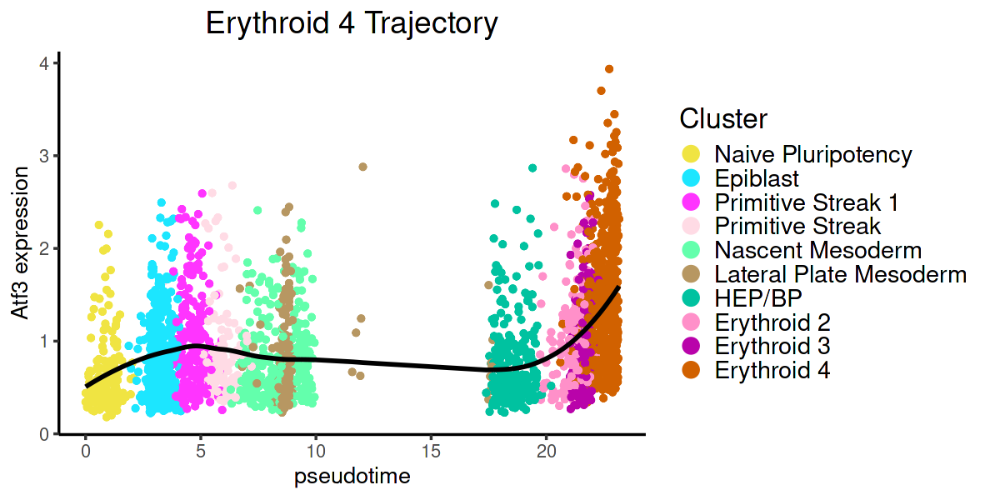

In [13]:
# Set plot size
options(repr.plot.width = 10, repr.plot.height = 5)


# Call function with custom colors
p <- plot_gene_specific_lineage_nozeros(
  atlas = obj,
  gene = "Atf3",
  lineage = "Lineage7",
  curves = curves,
  lineages = lineages
)
p


In [15]:
ggsave(filename = './figures/Atf3_expression_along_erythorid_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

In [16]:
ggsave(filename = './figures/Atf3_expression_along_erythorid_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

In [25]:
# Set plot size globally
options(repr.plot.width = 10, repr.plot.height = 5)

# List of all lineage names
all_lineages <- names(lineages@lineages)

# Loop through each lineage and plot
for (lin in all_lineages) {
  message(sprintf("Plotting for %s...", lin))
  
  p <- plot_gene_specific_lineage_nozeros(
    atlas   = obj,
    gene    = "Atf3",
    lineage = lin,
    curves  = curves,
    lineages= lineages
  )
  
  # Save as PDF
  ggsave(
    filename = sprintf('./figures/Atf3_expression_along_%s.pdf', lin),
    plot     = p,
    width    = 10,
    height   = 5,
    units    = 'in',
    dpi      = 300
  )
  
  # Save as PNG
  ggsave(
    filename = sprintf('./figures/Atf3_expression_along_%s.png', lin),
    plot     = p,
    width    = 10,
    height   = 5,
    units    = 'in',
    dpi      = 300
  )
}


Plotting for Lineage1...

Plotting for Lineage2...

Plotting for Lineage3...

Plotting for Lineage4...

Plotting for Lineage5...

Plotting for Lineage6...

Plotting for Lineage7...

Plotting for Lineage8...

Plotting for Lineage9...

Plotting for Lineage10...

Plotting for Lineage11...

Plotting for Lineage12...

Plotting for Lineage13...

Plotting for Lineage14...

Plotting for Lineage15...

Plotting for Lineage16...

Plotting for Lineage17...



In [26]:
# Set plot size globally
options(repr.plot.width = 10, repr.plot.height = 5)

# List of all lineage names
all_lineages <- names(lineages@lineages)

# Loop through each lineage and plot
for (lin in all_lineages) {
  message(sprintf("Plotting for %s...", lin))
  
  p <- plot_gene_specific_lineage_nozeros(
    atlas   = obj,
    gene    = "Zfp711",
    lineage = lin,
    curves  = curves,
    lineages= lineages
  )
  
  # Save as PDF
  ggsave(
    filename = sprintf('./figures/Zfp711_expression_along_%s.pdf', lin),
    plot     = p,
    width    = 10,
    height   = 5,
    units    = 'in',
    dpi      = 300
  )
  
  # Save as PNG
  ggsave(
    filename = sprintf('./figures/Zfp711_expression_along_%s.png', lin),
    plot     = p,
    width    = 10,
    height   = 5,
    units    = 'in',
    dpi      = 300
  )
}


Plotting for Lineage1...

Plotting for Lineage2...

Plotting for Lineage3...

Plotting for Lineage4...

Plotting for Lineage5...

Plotting for Lineage6...

Plotting for Lineage7...

Plotting for Lineage8...

Plotting for Lineage9...

Plotting for Lineage10...

Plotting for Lineage11...

Plotting for Lineage12...

Plotting for Lineage13...

Plotting for Lineage14...

Plotting for Lineage15...

Plotting for Lineage16...

Plotting for Lineage17...



In [27]:
# Set plot size globally
options(repr.plot.width = 10, repr.plot.height = 5)

# List of all lineage names
all_lineages <- names(lineages@lineages)

# Loop through each lineage and plot
for (lin in all_lineages) {
  message(sprintf("Plotting for %s...", lin))
  
  p <- plot_gene_specific_lineage_nozeros(
    atlas   = obj,
    gene    = "Zfp711",
    lineage = lin,
    curves  = curves,
    lineages= lineages
  )
  
  # Save as PDF
  ggsave(
    filename = sprintf('./figures/Bcl6b_expression_along_%s.pdf', lin),
    plot     = p,
    width    = 10,
    height   = 5,
    units    = 'in',
    dpi      = 300
  )
  
  # Save as PNG
  ggsave(
    filename = sprintf('./figures/Bcl6b_expression_along_%s.png', lin),
    plot     = p,
    width    = 10,
    height   = 5,
    units    = 'in',
    dpi      = 300
  )
}


Plotting for Lineage1...

Plotting for Lineage2...

Plotting for Lineage3...

Plotting for Lineage4...

Plotting for Lineage5...

Plotting for Lineage6...

Plotting for Lineage7...

Plotting for Lineage8...

Plotting for Lineage9...

Plotting for Lineage10...

Plotting for Lineage11...

Plotting for Lineage12...

Plotting for Lineage13...

Plotting for Lineage14...

Plotting for Lineage15...

Plotting for Lineage16...

Plotting for Lineage17...



# Actual CODING (THIS PART IS PERFORMED BEFORE THE PREVIOUS LINES, BUT FOR VISUALIZATION JSUT SWITCHED THE ORDER)

In [14]:
# ==============================================================================
# Calculate Cluster Centroids
# ==============================================================================
# Weighted centroid calculation for visualization

# Calculate cluster centroids (for plotting the labels later)
mm <- sparse.model.matrix(~ 0 + factor(obj$cell_type_subclusters))
colnames(mm) <- levels(factor(obj$cell_type_subclusters))
centroids2d <- as.matrix(t(t(obj@reductions$UMAP@cell.embeddings) %*% mm) / Matrix::colSums(mm))


# Using whole dataset: lineages and curves

In [15]:
# ==============================================================================
# SECTION 4: DEFINE TRAJECTORY ENDPOINTS
# ==============================================================================
# Terminal cell types for Slingshot trajectory inference

# Define lineage ends
ENDS <- c("EMP 4", "MkP 2", "Erythroid 4", "Limb Mesoderm 2", "Allantois", "Epicardium", "Mesenchyme 2" )

In [25]:
# ==============================================================================
# SECTION 5: COMPUTE LINEAGES
# ==============================================================================
# getLineages(): Build minimum spanning tree between clusters
# Uses 3D UMAP coordinates for trajectory inference

set.seed(1)
lineages <- as.SlingshotDataSet(getLineages(
  data           = obj@reductions$UMAP3D@cell.embeddings,
  clusterLabels  = obj$cell_type_subclusters,
  dist.method    = "slingshot", # It can be: "simple", "scaled.full", "scaled.diag", "slingshot" or "mnn"
  end.clus       = ENDS, # You can also define the ENDS!
  start.clus     = "Naive Pluripotency"
)) # define where to START the trajectories

lineages

slotNames(lineages)

class: SlingshotDataSet 

 Samples Dimensions
   71107          3

lineages: 17 
Lineage1: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  Limb Mesoderm 1  Allan/Mesen/Epic 1  Allan/Mesen/Epic 2  Atf3-KO Abundant  Epicar/Mesen 1  Epic/Mesen 2  
Lineage2: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  HEP/BP  Endothelium 1  EMP 1  EMP 2  EMP 3  EMP 4  
Lineage3: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  Limb Mesoderm 1  Allan/Mesen/Epic 1  Allan/Mesen/Epic 2  Atf3-KO Abundant  Epicar/Mesen 1  Epicardium  
Lineage4: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  HEP/BP  Erythroid 2  MkP/MEP  MkP 1  MkP 2  
Lineage5: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  Limb Mesoder

[1] "reducedDim"    "clusterLabels" "lineages"      "adjacency"    
[5] "curves"        "slingParams"

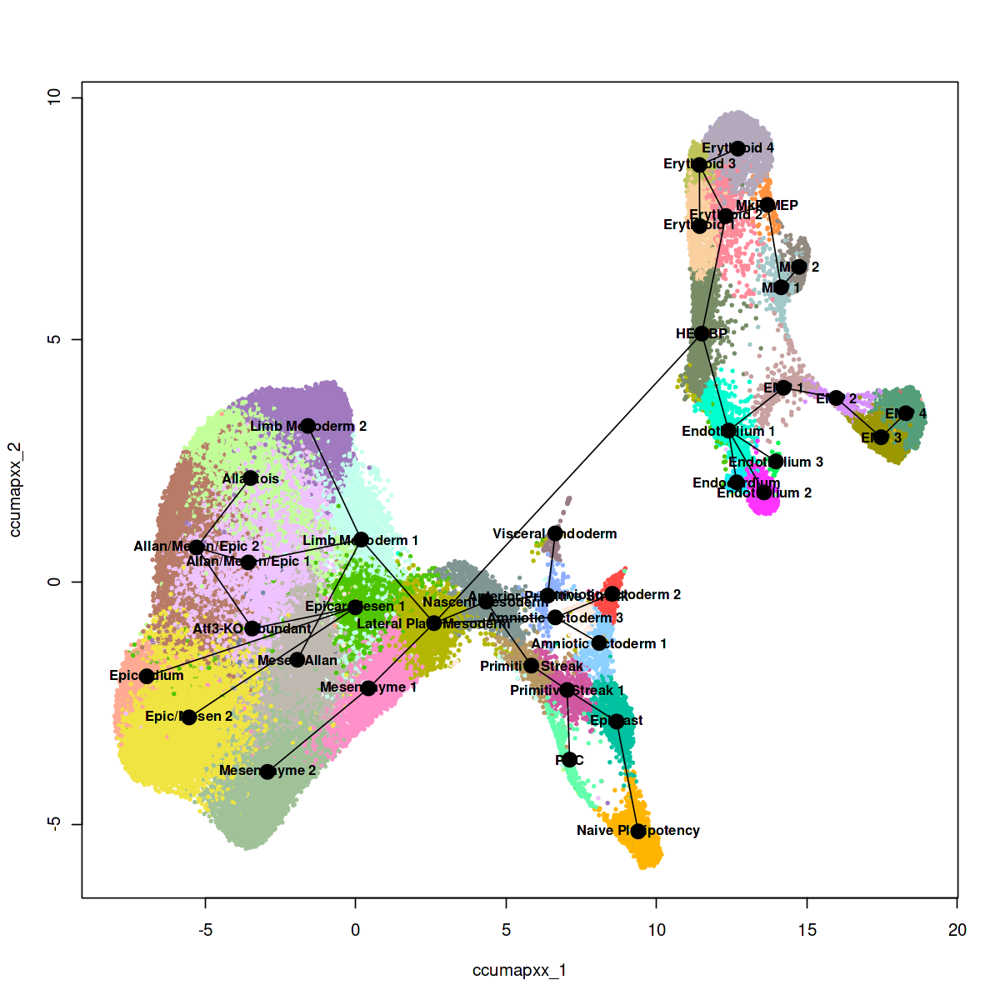

In [333]:
options(repr.plot.width = 10, repr.plot.height = 10)
# Change the reduction to our  UMAP2d (FOR VISUALISATION ONLY)
lineages@reducedDim <- obj@reductions$UMAP@cell.embeddings

{
  plot(obj@reductions$UMAP@cell.embeddings, col = r3dcol$cols_46[obj$cell_type_subclusters], cex = .5, pch = 16)
  lines(lineages, lwd = 1, col = "black", cex = 2)
  text(centroids2d, labels = rownames(centroids2d), cex = 0.8, font = 2, col = "black")
}

In [334]:
# ==============================================================================
# Export Lineages Plot (PDF)
# ==============================================================================

pdf('./figures/lineages.pdf', width = 10, height = 10)
options(repr.plot.width = 10, repr.plot.height = 10)
# Change the reduction to our  UMAP2d (FOR VISUALISATION ONLY)
lineages@reducedDim <- obj@reductions$UMAP@cell.embeddings

{
  plot(obj@reductions$UMAP@cell.embeddings, col = r3dcol$cols_46[obj$cell_type_subclusters], cex = .5, pch = 16)
  lines(lineages, lwd = 1, col = "black", cex = 2)
  text(centroids2d, labels = rownames(centroids2d), cex = 0.8, font = 2, col = "black")
}
dev.off()

Cairo 
    2

In [335]:
png('./figures/lineages.png', width = 10, height = 10,units = 'in',res = 300)
options(repr.plot.width = 10, repr.plot.height = 10)
# Change the reduction to our  UMAP2d (FOR VISUALISATION ONLY)
lineages@reducedDim <- obj@reductions$UMAP@cell.embeddings

{
  plot(obj@reductions$UMAP@cell.embeddings, col = r3dcol$cols_46[obj$cell_type_subclusters], cex = .5, pch = 16)
  lines(lineages, lwd = 1, col = "black", cex = 2)
  text(centroids2d, labels = rownames(centroids2d), cex = 0.8, font = 2, col = "black")
}
dev.off()

Cairo 
    2

In [27]:
# ==============================================================================
# SECTION 6: FIT SMOOTH CURVES
# ==============================================================================
# getCurves(): Fit smooth principal curves through lineages

# Define curves
curves <- as.SlingshotDataSet(getCurves(
  data          = lineages,
  thresh        = 1e-2,
  stretch       = 2,
  allow.breaks  = F,
# approx_points = 50,
 maxit = 15
))

curves

class: SlingshotDataSet 

 Samples Dimensions
   71107          2

lineages: 17 
Lineage1: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  Limb Mesoderm 1  Allan/Mesen/Epic 1  Allan/Mesen/Epic 2  Atf3-KO Abundant  Epicar/Mesen 1  Epic/Mesen 2  
Lineage2: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  HEP/BP  Endothelium 1  EMP 1  EMP 2  EMP 3  EMP 4  
Lineage3: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  Limb Mesoderm 1  Allan/Mesen/Epic 1  Allan/Mesen/Epic 2  Atf3-KO Abundant  Epicar/Mesen 1  Epicardium  
Lineage4: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  HEP/BP  Erythroid 2  MkP/MEP  MkP 1  MkP 2  
Lineage5: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  Limb Mesoder

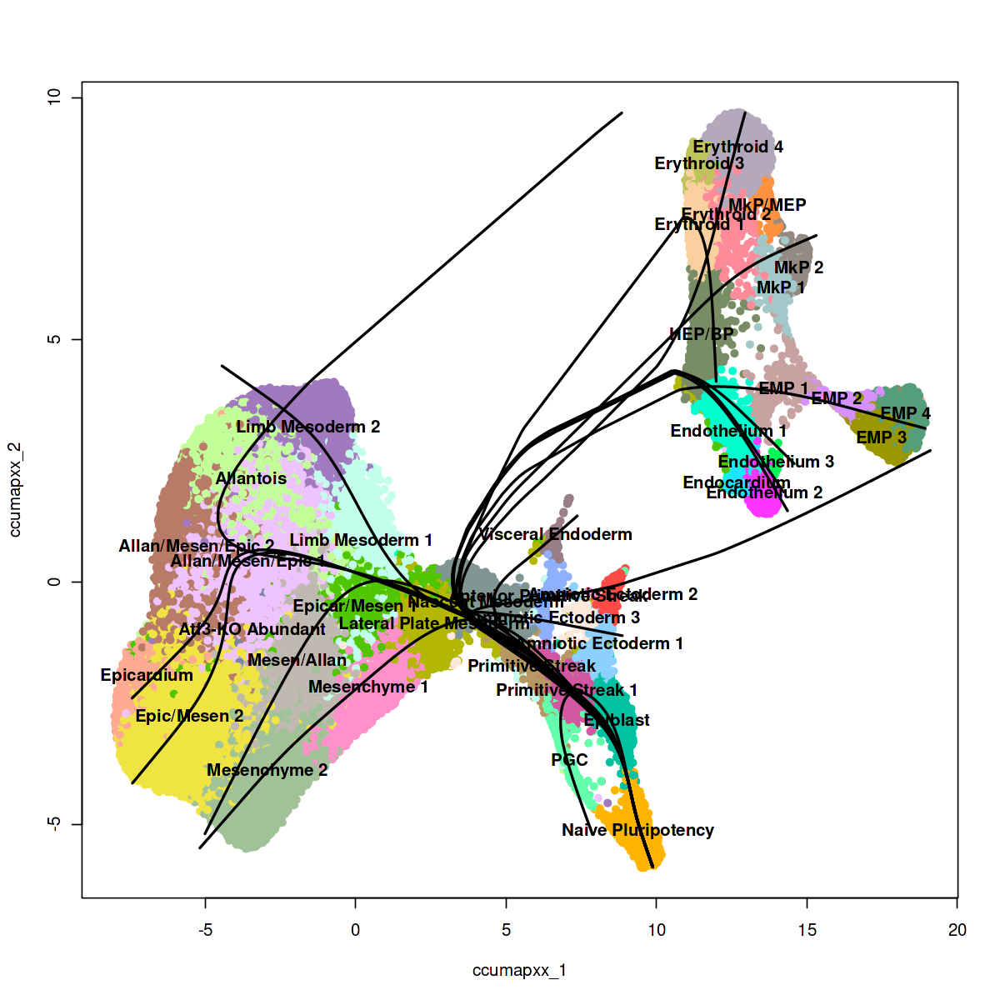

In [325]:
options(repr.plot.width = 10, repr.plot.height = 10)
# Plots
{
  plot(obj@reductions$UMAP@cell.embeddings, col = r3dcol$cols_46[obj$cell_type_subclusters], pch = 16)
  lines(curves, lwd = 2, col = "black")
  text(centroids2d, labels = levels(obj$cell_type_subclusters), cex = 1, font = 2)
}

In [326]:
pdf('./figures/curves_cell_types.pdf',width = 10,height = 10)
# Plots
{
  plot(obj@reductions$UMAP@cell.embeddings, col = r3dcol$cols_46[obj$cell_type_subclusters], pch = 16)
  lines(curves, lwd = 2, col = "black")
  text(centroids2d, labels = levels(obj$cell_type_subclusters), cex = 1, font = 2)
}
dev.off()

Cairo 
    2

In [327]:
png('./figures/curves_cell_types.png',width = 10,height = 10,units = 'in',res = 300)
options(repr.plot.width = 10, repr.plot.height = 10)
# Plots
{
  plot(obj@reductions$UMAP@cell.embeddings, col = r3dcol$cols_46[obj$cell_type_subclusters], pch = 16)
  lines(curves, lwd = 2, col = "black")
  text(centroids2d, labels = levels(obj$cell_type_subclusters), cex = 1, font = 2)
}
dev.off()

Cairo 
    2

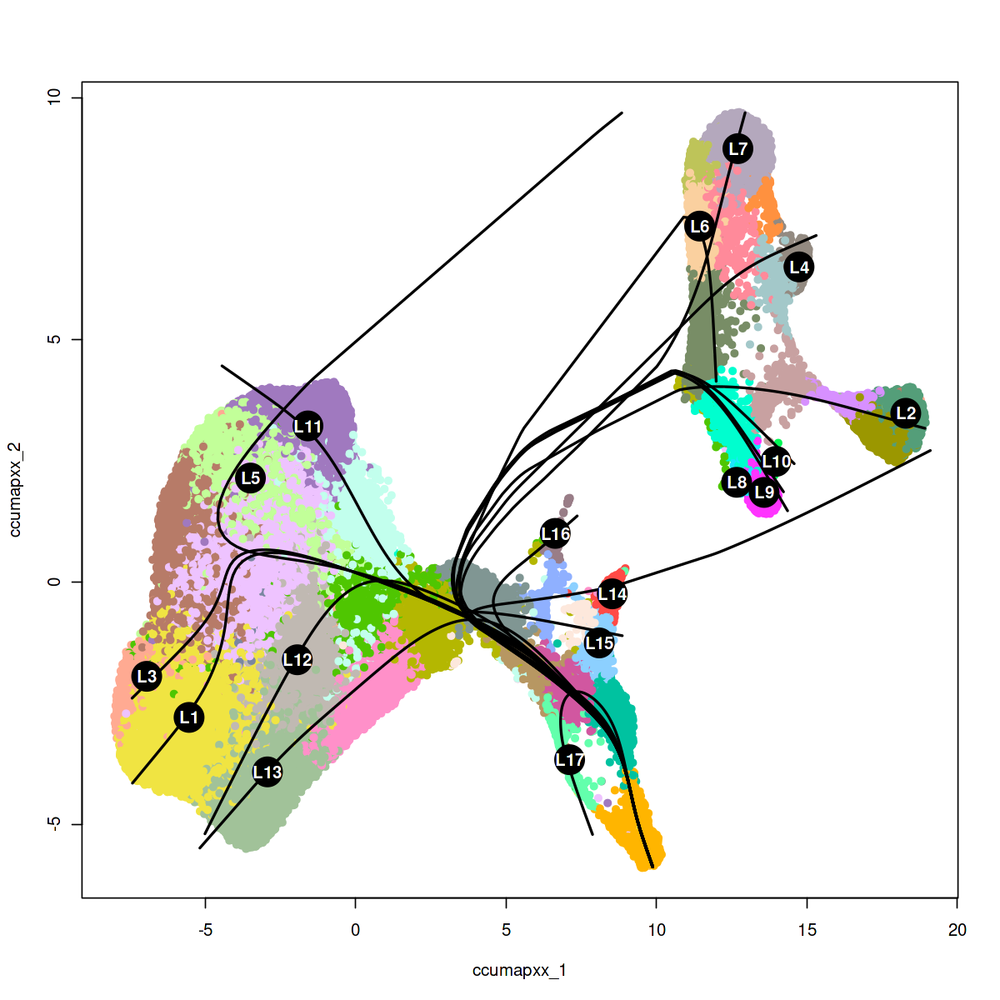

In [320]:
options(repr.plot.width = 10, repr.plot.height = 10)
lc <- sapply(lineages@lineages, function(x) {
  rev(x)[1]
})
names(lc) <- gsub("Lineage", "L", names(lc))
lc.idx = match(lc, levels(obj$cell_type_subclusters))

{
  plot(obj@reductions$UMAP@cell.embeddings, col = r3dcol$cols_46[obj$cell_type_subclusters], pch = 16)
  lines(curves, lwd = 2, col = "black")
  points(centroids2d[lc.idx, ], col = "black", pch = 16, cex = 4)
  text(centroids2d[lc.idx, ], labels = names(lc), cex = 1, font = 2, col = "white")
}

In [324]:
# ==============================================================================
# Export Curves Plot (PDF)
# ==============================================================================

pdf('./figures/curves.pdf',width = 10,height = 10)
options(repr.plot.width = 10, repr.plot.height = 10)
lc <- sapply(lineages@lineages, function(x) {
  rev(x)[1]
})
names(lc) <- gsub("Lineage", "L", names(lc))
lc.idx = match(lc, levels(obj$cell_type_subclusters))

{
  plot(obj@reductions$UMAP@cell.embeddings, col = r3dcol$cols_46[obj$cell_type_subclusters], pch = 16)
  lines(curves, lwd = 2, col = "black")
  points(centroids2d[lc.idx, ], col = "black", pch = 16, cex = 4)
  text(centroids2d[lc.idx, ], labels = names(lc), cex = 1, font = 2, col = "white")
}
dev.off()

Cairo 
    2

In [323]:
png('./figures/curves.png',width = 10,height = 10,units = 'in',res = 300)
options(repr.plot.width = 10, repr.plot.height = 10)
lc <- sapply(lineages@lineages, function(x) {
  rev(x)[1]
})
names(lc) <- gsub("Lineage", "L", names(lc))
lc.idx = match(lc, levels(obj$cell_type_subclusters))

{
  plot(obj@reductions$UMAP@cell.embeddings, col = r3dcol$cols_46[obj$cell_type_subclusters], pch = 16)
  lines(curves, lwd = 2, col = "black")
  points(centroids2d[lc.idx, ], col = "black", pch = 16, cex = 4)
  text(centroids2d[lc.idx, ], labels = names(lc), cex = 1, font = 2, col = "white")
}
dev.off()

Cairo 
    2

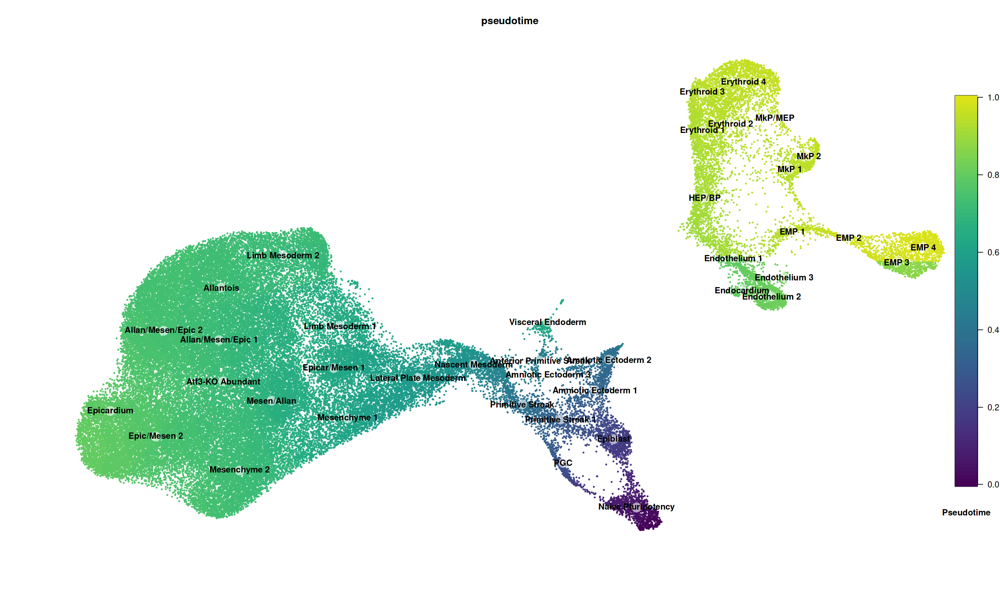

In [315]:
# ==============================================================================
# SECTION 7: VISUALIZE PSEUDOTIME
# ==============================================================================
# Color cells by pseudotime value (viridis palette)

library(viridis)
library(fields)

options(repr.plot.width = 20, repr.plot.height = 12)

pseudotime <- slingPseudotime(curves, na = FALSE)
cellWeights <- slingCurveWeights(curves)
pal_viridis <- viridis(100, end = 0.95)

x <- rowMeans(pseudotime)
x <- x / max(x, na.rm = TRUE)
o <- order(x)

# Make sure color indexing is safe
col_idx <- as.integer(x[o] * (length(pal_viridis) - 1)) + 1

# PLOT
plot(obj@reductions$UMAP@cell.embeddings[o, ],
  main = "pseudotime", pch = 16, cex = 0.4, axes = FALSE, xlab = "", ylab = "",
  col = pal_viridis[col_idx]
)

if (exists("centroids2d")) {
  points(centroids2d, cex = 2.5, pch = 16, col = "#FFFFFF99")
  # Check if the number of labels matches centroids
  n_labels <- length(levels(obj$cell_type_subclusters))
  n_centroids <- if (is.matrix(centroids2d)) nrow(centroids2d) else length(centroids2d)
  if (n_labels == n_centroids) {
    text(centroids2d, labels = levels(obj$cell_type_subclusters), cex = 1, font = 2)
  } else {
    warning("Number of centroids and labels do not match.")
  }
}

image.plot(
  legend.only = TRUE,
  zlim = range(x, na.rm = TRUE),
  col = pal_viridis,
  legend.args = list(text = "Pseudotime", side = 1, font = 2, line = 2),
  legend.mar = 1,        # <-- Increase margin to shift right (try values 5-10)
  legend.width = 1       # <-- Optional: make legend thicker (default is 1.2)
)


In [317]:
# ==============================================================================
# SECTION 7: VISUALIZE PSEUDOTIME
# ==============================================================================
# Color cells by pseudotime value (viridis palette)

pdf(file = './figures/pseudotime.pdf',width = 20, height = 15)
library(viridis)
library(fields)

options(repr.plot.width = 20, repr.plot.height = 12)

pseudotime <- slingPseudotime(curves, na = FALSE)
cellWeights <- slingCurveWeights(curves)
pal_viridis <- viridis(100, end = 0.95)

x <- rowMeans(pseudotime)
x <- x / max(x, na.rm = TRUE)
o <- order(x)

# Make sure color indexing is safe
col_idx <- as.integer(x[o] * (length(pal_viridis) - 1)) + 1

# PLOT
plot(obj@reductions$UMAP@cell.embeddings[o, ],
  main = "pseudotime", pch = 16, cex = 0.4, axes = FALSE, xlab = "", ylab = "",
  col = pal_viridis[col_idx]
)

if (exists("centroids2d")) {
  points(centroids2d, cex = 2.5, pch = 16, col = "#FFFFFF99")
  # Check if the number of labels matches centroids
  n_labels <- length(levels(obj$cell_type_subclusters))
  n_centroids <- if (is.matrix(centroids2d)) nrow(centroids2d) else length(centroids2d)
  if (n_labels == n_centroids) {
    text(centroids2d, labels = levels(obj$cell_type_subclusters), cex = 1, font = 2)
  } else {
    warning("Number of centroids and labels do not match.")
  }
}

image.plot(
  legend.only = TRUE,
  zlim = range(x, na.rm = TRUE),
  col = pal_viridis,
  legend.args = list(text = "Pseudotime", side = 1, font = 2, line = 2),
  legend.mar = 1.2,        # <-- Increase margin to shift right (try values 5-10)
  legend.width = 1       # <-- Optional: make legend thicker (default is 1.2)
)

dev.off()

Cairo 
    2

In [318]:
# ==============================================================================
# SECTION 7: VISUALIZE PSEUDOTIME
# ==============================================================================
# Color cells by pseudotime value (viridis palette)

png(file = './figures/pseudotime.png',units = 'in',res = 300,width = 20, height = 15)
library(viridis)
library(fields)

options(repr.plot.width = 20, repr.plot.height = 12)

pseudotime <- slingPseudotime(curves, na = FALSE)
cellWeights <- slingCurveWeights(curves)
pal_viridis <- viridis(100, end = 0.95)

x <- rowMeans(pseudotime)
x <- x / max(x, na.rm = TRUE)
o <- order(x)

# Make sure color indexing is safe
col_idx <- as.integer(x[o] * (length(pal_viridis) - 1)) + 1

# PLOT
plot(obj@reductions$UMAP@cell.embeddings[o, ],
  main = "pseudotime", pch = 16, cex = 0.4, axes = FALSE, xlab = "", ylab = "",
  col = pal_viridis[col_idx]
)

if (exists("centroids2d")) {
  points(centroids2d, cex = 2.5, pch = 16, col = "#FFFFFF99")
  # Check if the number of labels matches centroids
  n_labels <- length(levels(obj$cell_type_subclusters))
  n_centroids <- if (is.matrix(centroids2d)) nrow(centroids2d) else length(centroids2d)
  if (n_labels == n_centroids) {
    text(centroids2d, labels = levels(obj$cell_type_subclusters), cex = 1, font = 2)
  } else {
    warning("Number of centroids and labels do not match.")
  }
}

image.plot(
  legend.only = TRUE,
  zlim = range(x, na.rm = TRUE),
  col = pal_viridis,
  legend.args = list(text = "Pseudotime", side = 1, font = 2, line = 2),
  legend.mar = 1.2,        # <-- Increase margin to shift right (try values 5-10)
  legend.width = 1       # <-- Optional: make legend thicker (default is 1.2)
)

dev.off()

Cairo 
    2

# Finding differentially expressed genes

In [55]:
sel_cells <- split(colnames(obj@assays$RNA@data), obj$cell_type_subclusters)
sel_cells <- unlist(lapply(sel_cells, function(x) {
  set.seed(1)
  return(sample(x, 20))
}))
head(sel_cells)

Naive Pluripotency1    Naive Pluripotency2    Naive Pluripotency3 
"GCCATGGCACAACGTT-1_5" "AGGGTGATCTGCGAGC-1_4" "TCAGCCTTCGCAGTGC-1_1" 
   Naive Pluripotency4    Naive Pluripotency5    Naive Pluripotency6 
"AGTGCCGTCAGCTTCC-1_5" "CCAATGAAGGGAGATA-1_3" "GGGACCTGTAGAGATT-1_2"

In [56]:
# ==============================================================================
# SECTION 8: FIND VARIABLE GENES
# ==============================================================================
# Select highly variable genes for differential expression

gv <- as.data.frame(na.omit(scran::modelGeneVar(obj@assays$RNA@data[, sel_cells])))
head(gv)


,mean,total,tech,bio,p.value,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Xkr4,0.096581673,0.093929966,0.062967301,0.0309626652,1.329159e-02,0.1977813499
Gm1992,0.003761365,0.001988855,0.002457118,-0.0004682633,8.049541e-01,0.8828708272
Rp1,0.001699899,0.001335942,0.001110463,0.0002254788,1.799093e-01,0.8535606505
Sox17,0.055766294,0.069202637,0.036408792,0.0327938450,2.432405e-05,0.0010225788
Gm37323,0.001554223,0.001932488,0.001015300,0.0009171876,2.310660e-05,0.0009757147
Mrpl15,0.756405400,0.314567583,0.338868060,-0.0243004766,6.268041e-01,0.8535606505


In [57]:
gv <- gv[order(gv$bio, decreasing = T), ]

In [58]:
head(gv)

,mean,total,tech,bio,p.value,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Hba-x,0.9379836,4.295017,0.3650582,3.929959,0.000000e+00,0.000000e+00
Hbb-y,0.5713964,3.181188,0.2927140,2.888474,0.000000e+00,0.000000e+00
Tmsb4x,2.6691418,2.879876,0.2461510,2.633725,0.000000e+00,0.000000e+00
Hba-a1,0.6672703,2.375169,0.3191183,2.056051,6.420144e-186,3.049889e-182
Hbb-bh1,0.7404003,2.331646,0.3355924,1.996054,8.573269e-159,2.327275e-155
Peg3,1.6383141,2.000980,0.3536295,1.647350,2.744242e-98,6.518262e-95


In [59]:
dim(gv)

[1] 19002     6

In [61]:
sel_genes <- sort(rownames(gv)[1:10000])

In [73]:
#sceGAM <- fitGAM(
#    counts = drop0(obj@assays$RNA@data[sel_genes, sel_cells]),
#    pseudotime = pseudotime[sel_cells, ],
#    cellWeights = cellWeights[sel_cells, ],
#    nknots = 6, verbose = T, parallel = T, sce = TRUE,
#    BPPARAM = BiocParallel::MulticoreParam()
#)

Warning message in .findKnots(nknots, pseudotime, wSamp):
"Impossible to place a knot at all endpoints.Increase the number of knots to avoid this issue."


  |                                                                      |   0%


In [74]:
ls()

[1] "bio_pkgs"                  "BPPARAM"                  
 [3] "cellWeights"               "centroids2d"              
 [5] "col_idx"                   "curves"                   
 [7] "data_pkgs"                 "df"                       
 [9] "ENDS"                      "fn_add_cellcycle_score"   
[11] "fn_clean_seurat"           "fn_find_low_count_genes"  
[13] "fn_process_soupX"          "fn_scDblFinder"           
[15] "fn_soupx"                  "general_pkgs"             
[17] "gv"                        "imprint_genes"            
[19] "io"                        "lc"                       
[21] "lc.idx"                    "lineages"                 
[23] "mm"                        "n_centroids"              
[25] "n_labels"                  "o"                        
[27] "obj"                       "opts"                     
[29] "p_State"                   "pal"                      
[31] "pal_viridis"               "pkgs"                     
[33] "pseudotime"                "r3dcol"                   
[35] "RegressOutMatrix"          "RegressOutMatrix_parallel"
[37] "sel_cells"                 "sel_genes"                
[39] "viz_pkgs"                  "x"

In [76]:
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,13388960,715.1,20269697,1082.6,20269697,1082.6
Vcells,822948726,6278.7,2567806202,19590.9,5015246072,38263.3


## Plots for all annotations

In [83]:
# ==============================================================================
# SECTION 9: DEFINE PLOTTING FUNCTIONS
# ==============================================================================
# Custom functions for gene expression along pseudotime

plot_gene_overall_pseudotime <- function(obj, pseudotime, gene, lineage, cluster_colors) {
  # Use all cells with non-NA pseudotime for the lineage
  all_cells <- which(!is.na(pseudotime[, lineage]))
  df <- data.frame(
    pseudotime = pseudotime[all_cells, lineage],
    expr = FetchData(obj, vars = gene)[all_cells, 1],
    cluster = as.character(obj$cell_type_subclusters[all_cells])
  )
  df$cluster <- factor(df$cluster, levels = names(cluster_colors))
  
  library(ggplot2)
  ggplot(df, aes(x = pseudotime, y = expr, color = cluster)) +
    geom_point(size = 0, alpha = 0.7) +
    geom_smooth(method = "loess", color = "black", se = TRUE, span = 0.5) +
    scale_color_manual(values = cluster_colors, name = "Cluster") +
    guides(color = guide_legend(override.aes = list(size = 4))) +
    labs(
      title = paste(gene, "expression across all pseudotime (", lineage, ")", sep = ""),
      x = paste("Pseudotime (", lineage, ")", sep = ""),
      y = paste(gene, "expression")
    ) +
    theme_classic(base_size = 15) +
    theme(
      legend.text = element_text(size = 15),
      legend.title = element_text(size = 17)
    )
}


In [84]:
# Get your cluster levels (order is important)
cluster_levels <- levels(obj$cell_type_subclusters)

colors <- c(r3dcol$cols_46)
# Assign these as names to your color vector
names(colors) <- cluster_levels


`geom_smooth()` using formula = 'y ~ x'
Warning message:
"Failed to fit group -1.
Caused by error in `predLoess()`:
! workspace required (5056809906) is too large probably because of setting 'se = TRUE'."


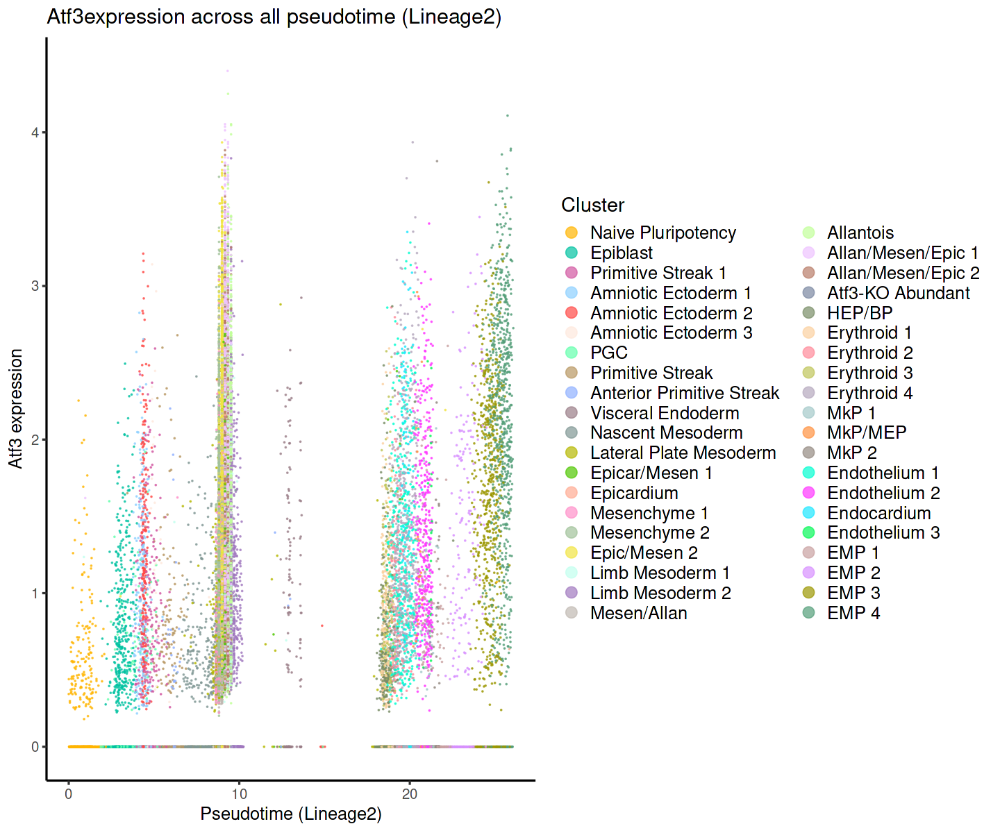

In [85]:
options(repr.plot.width = 12, repr.plot.height = 10)
plot_gene_overall_pseudotime(
  obj = obj,
  pseudotime = pseudotime,
  gene = "Atf3",
  lineage = "Lineage2",
  cluster_colors = colors
)

In [196]:
# ==============================================================================
# Define Lineage-Specific Plotting Function
# ==============================================================================

plot_gene_specific_lineage <- function(obj, pseudotime, cell_weights, gene, lineage, cluster_colors, lineages) {
  library(ggplot2)
  library(ggrastr)
  
  weights <- cell_weights[, lineage]
  cells <- names(weights)[weights > 0.5 & !is.na(pseudotime[, lineage])]
  if (length(cells) == 0) stop("No cells with high confidence in this lineage.")
  
  df <- data.frame(
    pseudotime = pseudotime[cells, lineage],
    expr = FetchData(obj, vars = gene)[cells, 1],
    cluster = as.character(obj$cell_type_subclusters[cells]),
    cell = cells
  )
  df$cluster <- factor(df$cluster, levels = names(cluster_colors))
  
  clusters_of_interest <- lineages@lineages[[lineage]]
  df_sub <- df[df$cluster %in% clusters_of_interest, ]
  endpoint_cluster <- tail(clusters_of_interest, 1)
  
  main_title <- paste0(gene, " expression along ", endpoint_cluster)
 # sub_title  <- paste0("Endpoint: ", endpoint_cluster)
  
  ggplot(df_sub, aes(x = pseudotime, y = expr, color = cluster)) +
    ggrastr::geom_point_rast(size = 1, alpha = 0.5) +
    geom_smooth(method = "loess", color = "black", se = TRUE, span = 0.5) +
    scale_color_manual(values = cluster_colors, name = "Cluster") +
    guides(color = guide_legend(override.aes = list(size = 5))) +
    labs(
      title = main_title,
     # subtitle = sub_title,
      x = paste("Pseudotime (", endpoint_cluster, "-",lineage, ")", sep = ""),
      y = paste(gene, "expression")
    ) +
    theme_classic(base_size = 16) +
    theme(
      plot.title = element_text(size = 22, face = "bold", hjust = 0.5, vjust = 1),
    #  plot.subtitle = element_text(size = 18, face = "bold", hjust = 0.5, vjust = 1),
      legend.text = element_text(size = 17),
      legend.title = element_text(size = 20,  vjust = 0.5)
    )
}


In [197]:
# Get your cluster levels (order is important)
cluster_levels <- levels(obj$cell_type_subclusters)

colors <- c(r3dcol$cols_94)
# Assign these as names to your color vector
names(colors) <- cluster_levels


In [198]:
lineages

class: SlingshotDataSet 

 Samples Dimensions
   71107          2

lineages: 17 
Lineage1: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  Limb Mesoderm 1  Allan/Mesen/Epic 1  Allan/Mesen/Epic 2  Atf3-KO Abundant  Epicar/Mesen 1  Epic/Mesen 2  
Lineage2: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  HEP/BP  Endothelium 1  EMP 1  EMP 2  EMP 3  EMP 4  
Lineage3: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  Limb Mesoderm 1  Allan/Mesen/Epic 1  Allan/Mesen/Epic 2  Atf3-KO Abundant  Epicar/Mesen 1  Epicardium  
Lineage4: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  HEP/BP  Erythroid 2  MkP/MEP  MkP 1  MkP 2  
Lineage5: Naive Pluripotency  Epiblast  Primitive Streak 1  Primitive Streak  Nascent Mesoderm  Lateral Plate Mesoderm  Limb Mesoder

### Atf3

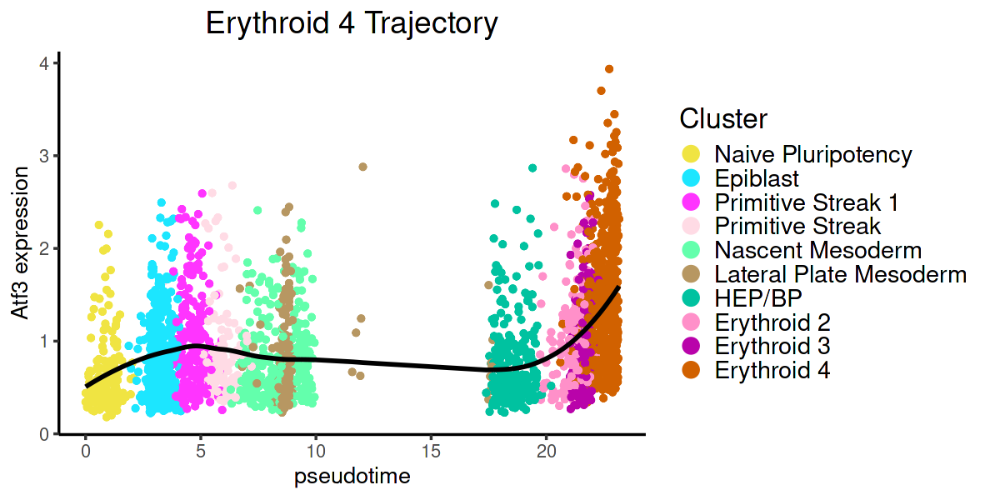

In [12]:
# Set plot size
options(repr.plot.width = 10, repr.plot.height = 5)


# Call function with custom colors
p <- plot_gene_specific_lineage_nozeros(
  atlas = obj,
  gene = "Atf3",
  lineage = "Lineage7",
  curves = curves,
  lineages = lineages
)
p


In [207]:
ggsave(filename = './figures/Atf3_expression_along_erythorid_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'


In [208]:
ggsave(filename = './figures/Atf3_expression_along_erythorid_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


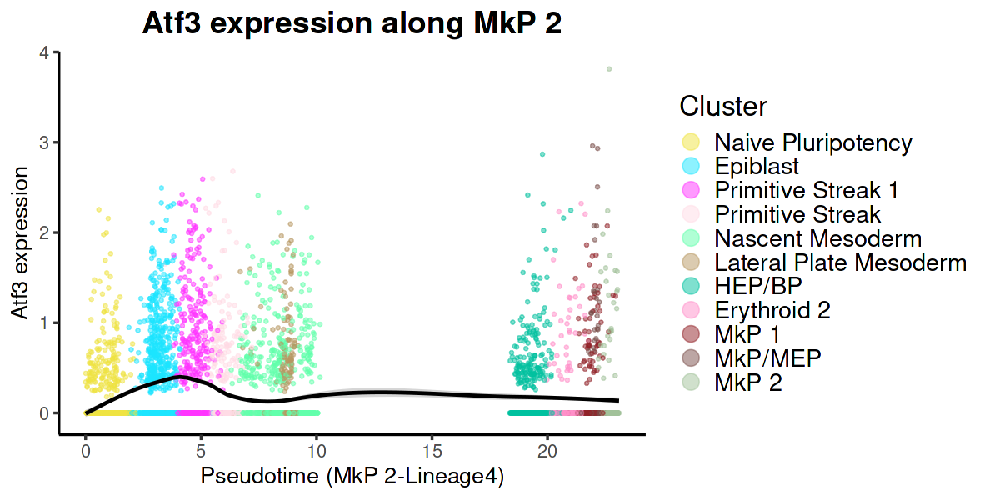

In [209]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage4",
  cluster_colors = colors,
  lineages = lineages
)

p

In [210]:
ggsave(filename = './figures/Atf3_expression_along_MkP_2_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_MkP_2_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


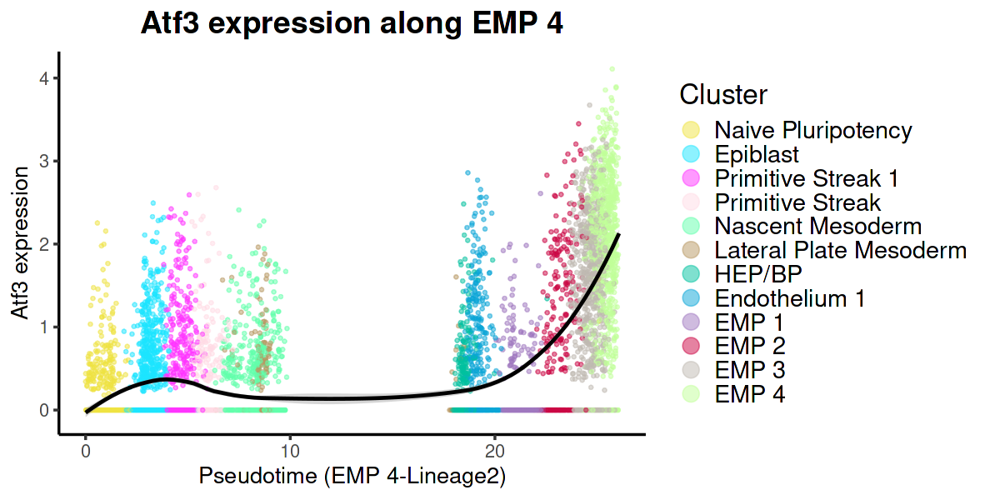

In [211]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage2",
  cluster_colors = colors,
  lineages = lineages
)

p

In [212]:
ggsave(filename = './figures/Atf3_expression_along_EMP_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_EMP_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


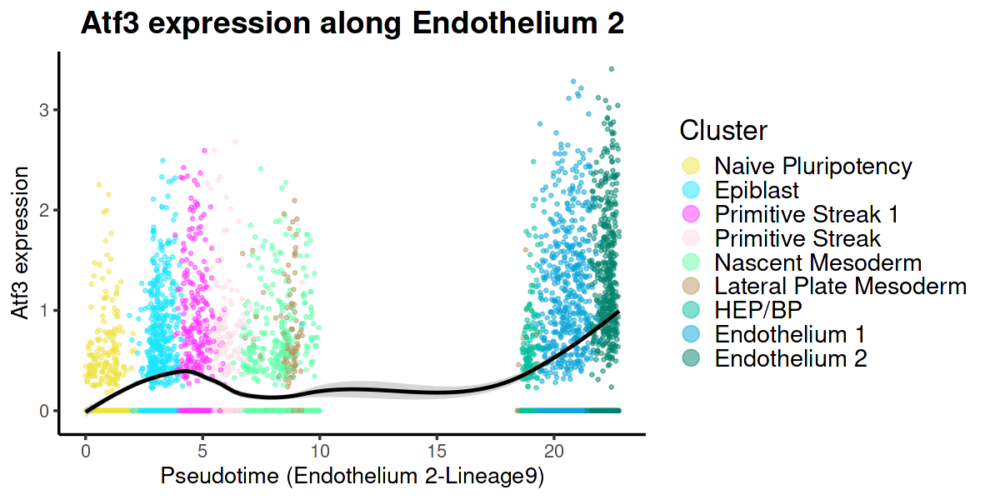

In [213]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage9",
  cluster_colors = colors,
  lineages = lineages
)

p

In [214]:
ggsave(filename = './figures/Atf3_expression_along_Endothelium_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_Endothelium_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


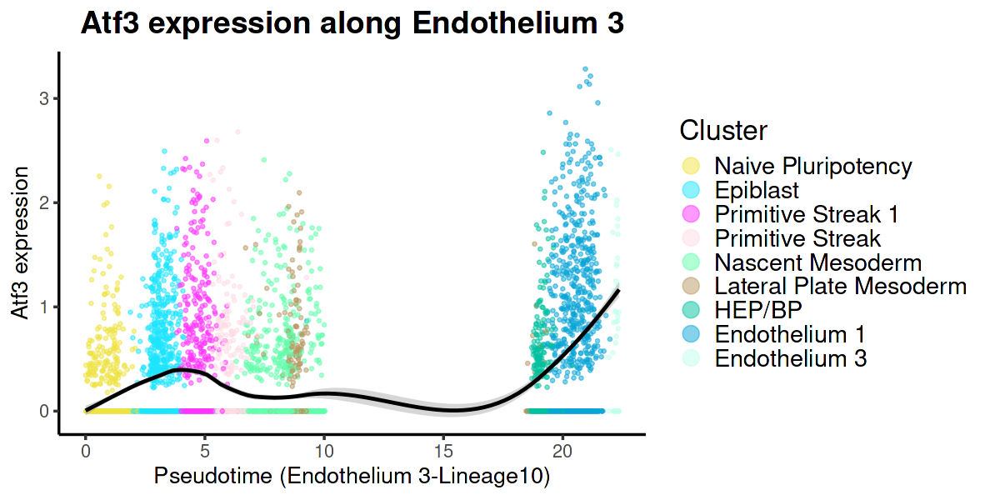

In [215]:
# ==============================================================================
# SECTION 10: ATF3 EXPRESSION ALONG LINEAGES
# ==============================================================================
# Plot Atf3 expression vs pseudotime for each trajectory

options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage10",
  cluster_colors = colors,
  lineages = lineages
)

p

In [216]:
ggsave(filename = './figures/Atf3_expression_along_Endothelium_Rsad2_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_Endothelium_Rsad2_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


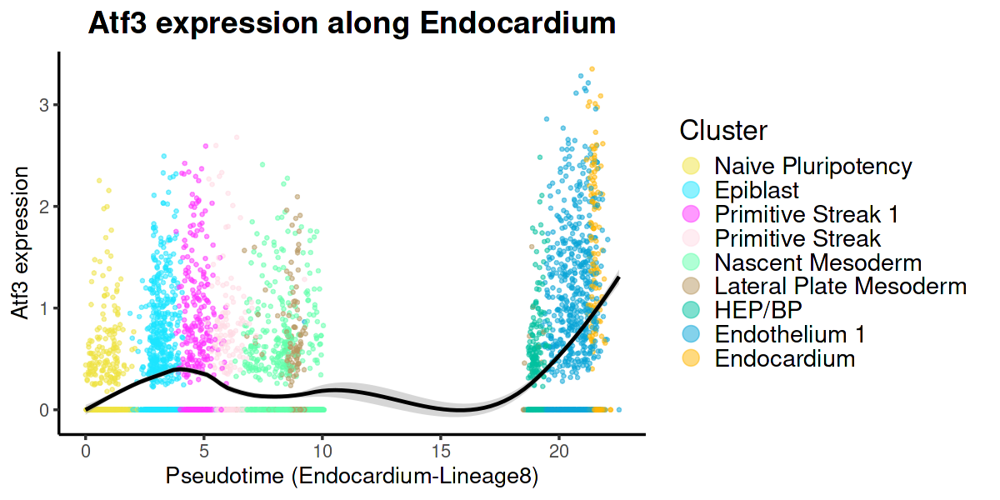

In [218]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage8",
  cluster_colors = colors,
  lineages = lineages
)

p

In [219]:
ggsave(filename = './figures/Atf3_expression_along_Endocardium_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_Endocardium_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


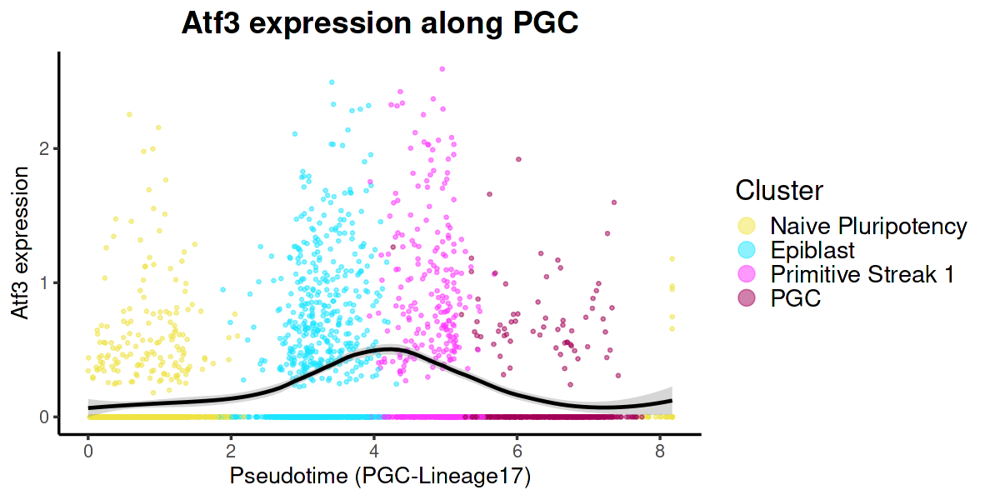

In [220]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage17",
  cluster_colors = colors,
  lineages = lineages
)

p

In [221]:
ggsave(filename = './figures/Atf3_expression_along_PGC_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_PGC_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


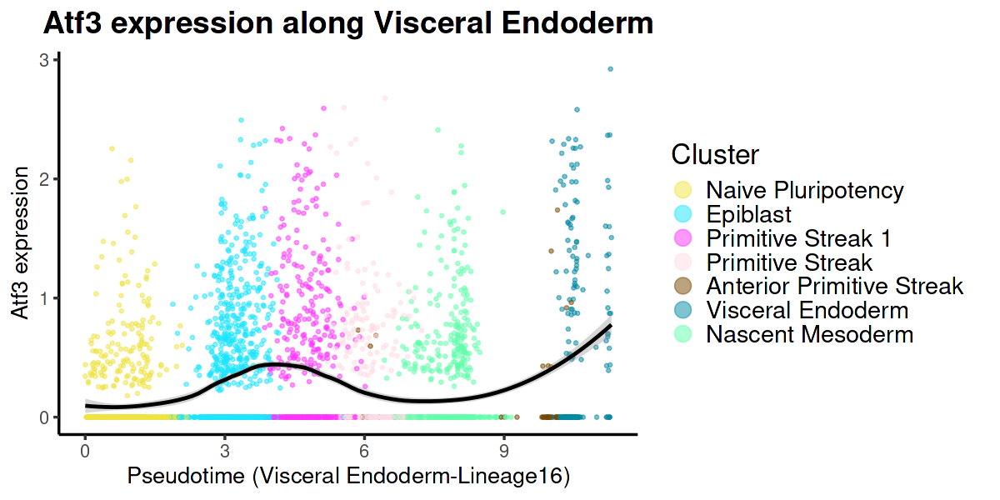

In [222]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage16",
  cluster_colors = colors,
  lineages = lineages
)

p

In [223]:
ggsave(filename = './figures/Atf3_expression_along_visceral_endoderm_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_visceral_endoderm_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


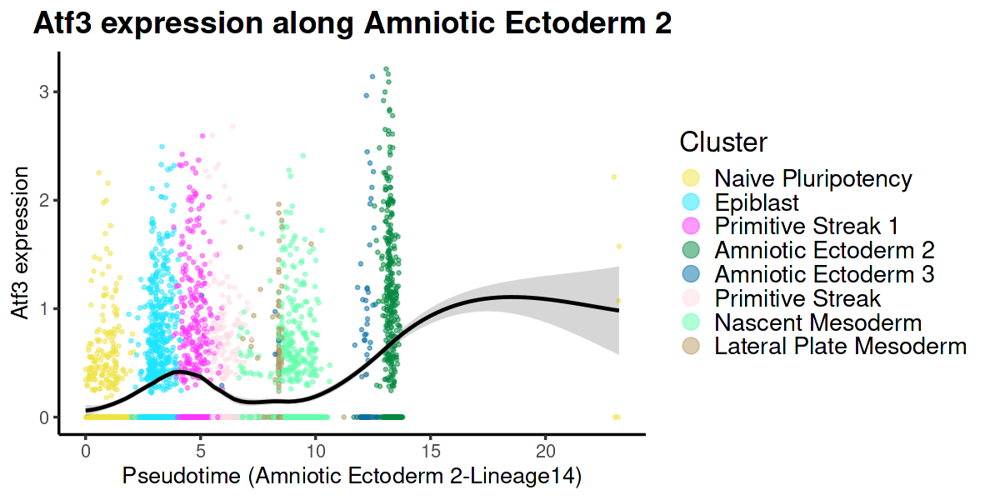

In [224]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage14",
  cluster_colors = colors,
  lineages = lineages
)

p

In [225]:
ggsave(filename = './figures/Atf3_expression_along_amniotic_ectoderm_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_amniotic_ectoderm_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


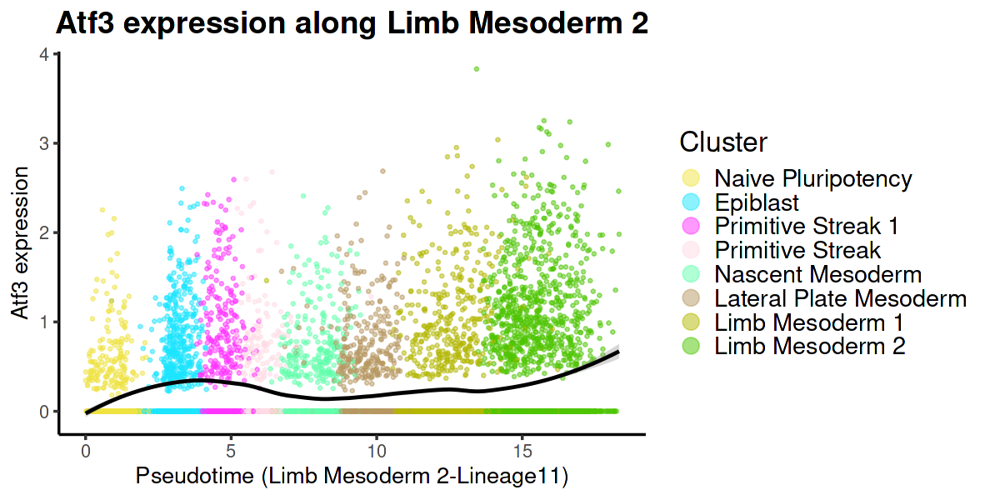

In [226]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage11",
  cluster_colors = colors,
  lineages = lineages
)

p

In [227]:
ggsave(filename = './figures/Atf3_expression_along_limb_mesoderm_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_limb_mesoderm_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


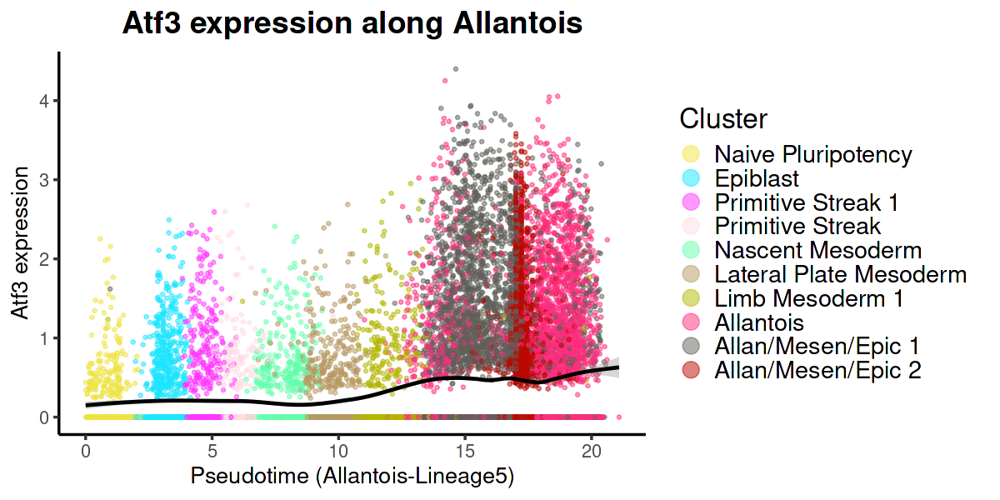

In [228]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage5",
  cluster_colors = colors,
  lineages = lineages
)

p

In [229]:
ggsave(filename = './figures/Atf3_expression_along_allantois_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_allantois_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


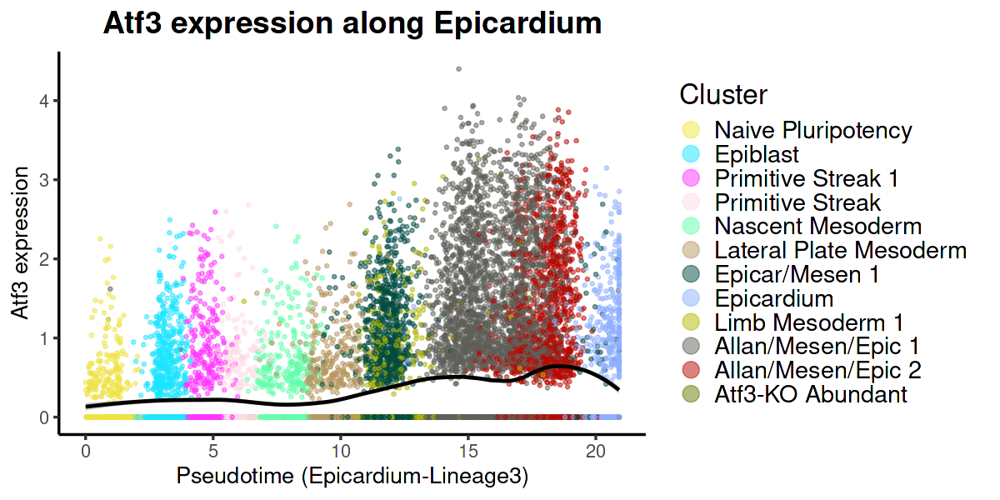

In [231]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage3",
  cluster_colors = colors,
  lineages = lineages
)

p

In [232]:
ggsave(filename = './figures/Atf3_expression_along_epicardium_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_epicardium_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


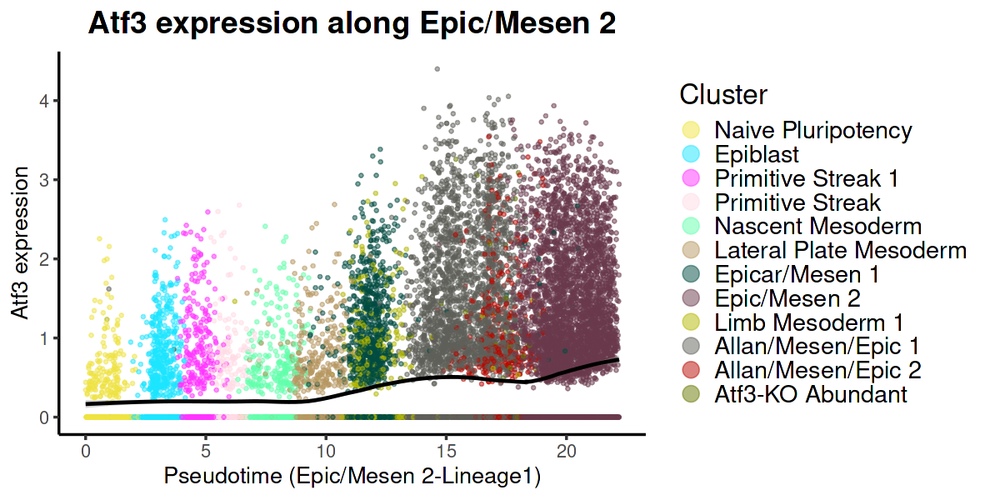

In [233]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage1",
  cluster_colors = colors,
  lineages = lineages
)

p

In [234]:
ggsave(filename = './figures/Atf3_expression_along_Epicardium_mesenchyme2_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_Epicardium_mesenchyme2_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


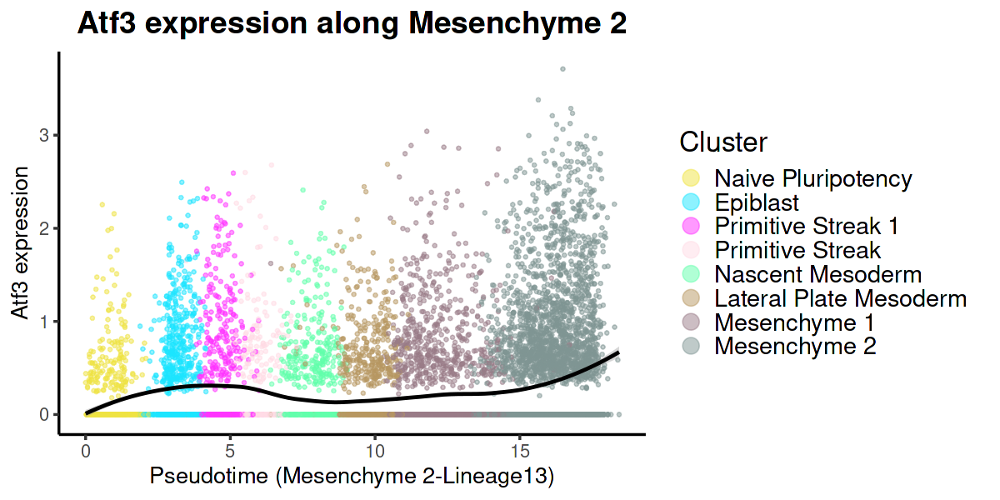

In [235]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage13",
  cluster_colors = colors,
  lineages = lineages
)

p

In [236]:
ggsave(filename = './figures/Atf3_expression_along_Mesenchyme2_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_Mesenchyme2_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


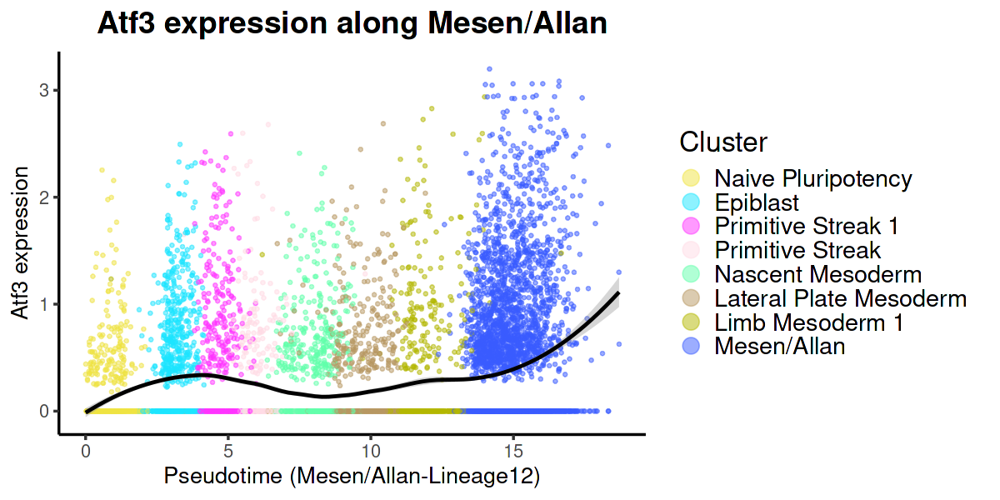

In [237]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Atf3",
  lineage = "Lineage12",
  cluster_colors = colors,
  lineages = lineages
)

p

In [239]:
ggsave(filename = './figures/Atf3_expression_along_Mesen_Allan_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_Mesen_Allan_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


### Zfp711

`geom_smooth()` using formula = 'y ~ x'


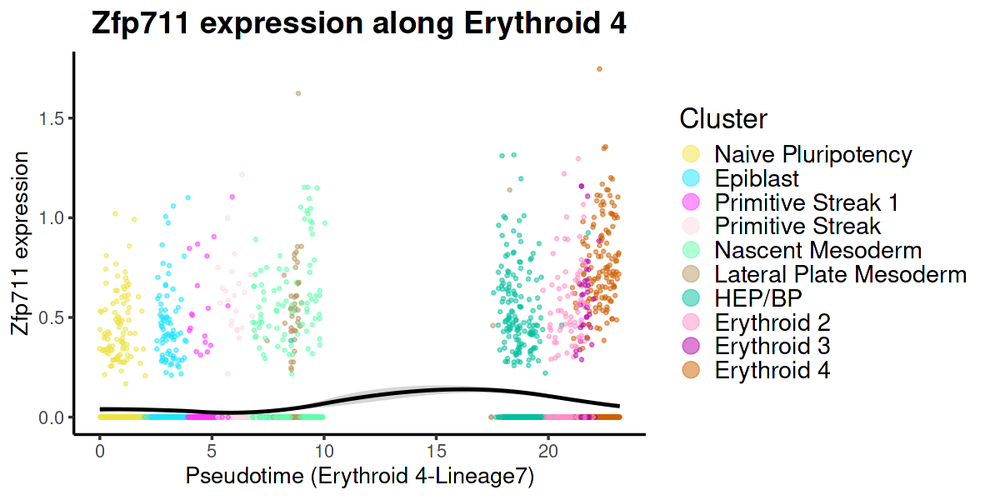

In [240]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage7",
  cluster_colors = colors,
  lineages = lineages
)

p

In [241]:
ggsave(filename = './figures/Zfp711_expression_along_erythorid_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_erythorid_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


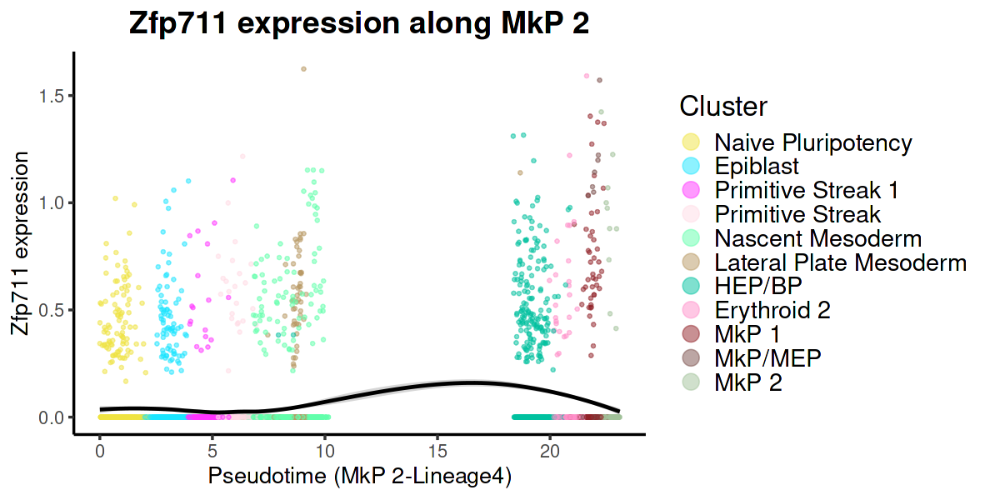

In [242]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage4",
  cluster_colors = colors,
  lineages = lineages
)

p

In [243]:
ggsave(filename = './figures/Zfp711_expression_along_MkP_2_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_MkP_2_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


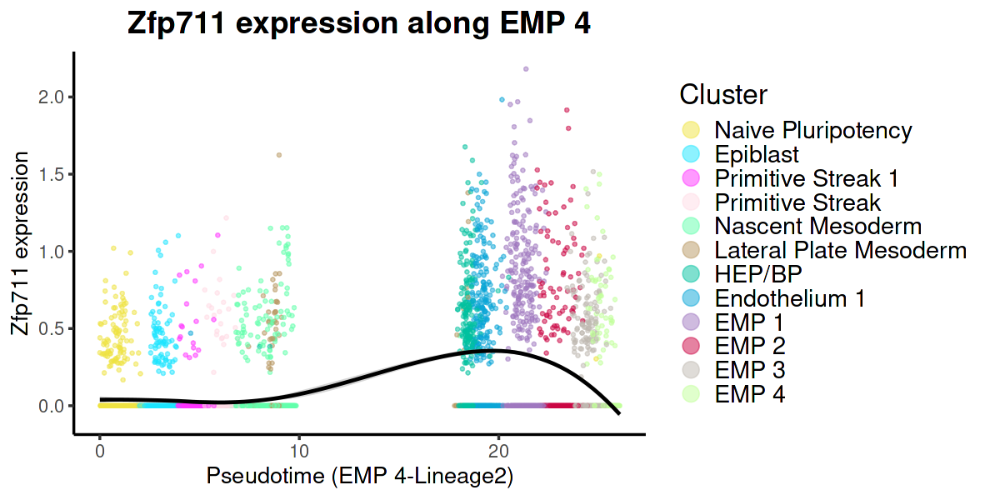

In [244]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage2",
  cluster_colors = colors,
  lineages = lineages
)

p

In [245]:
ggsave(filename = './figures/Zfp711_expression_along_EMP_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_EMP_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


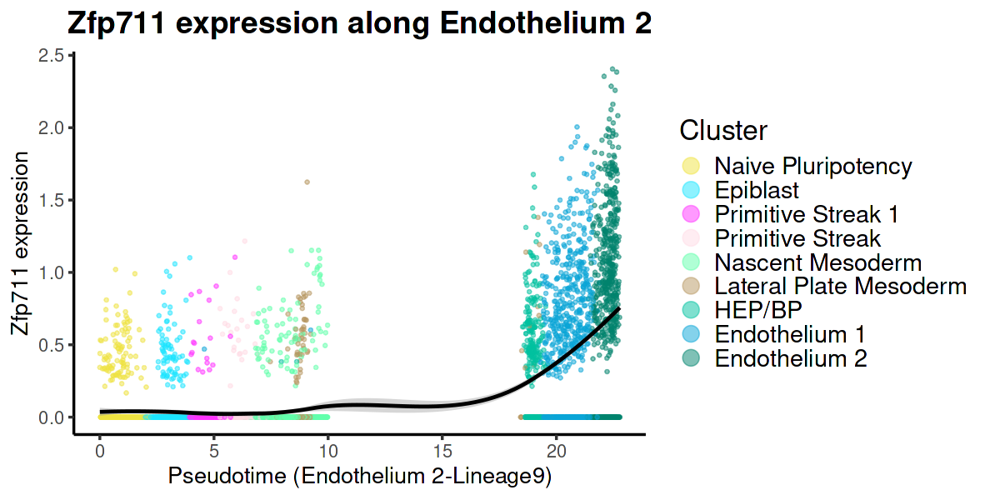

In [246]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage9",
  cluster_colors = colors,
  lineages = lineages
)

p

In [214]:
ggsave(filename = './figures/Atf3_expression_along_Endothelium_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_Endothelium_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


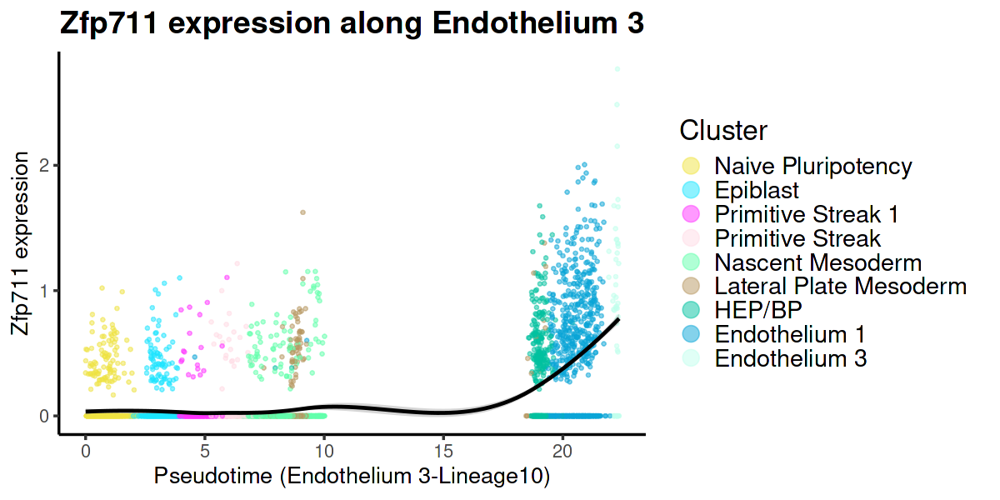

In [300]:
# ==============================================================================
# SECTION 11: ZFP711 EXPRESSION ALONG LINEAGES
# ==============================================================================
# Plot Zfp711 expression vs pseudotime for each trajectory

options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage10",
  cluster_colors = colors,
  lineages = lineages
)

p

In [301]:
ggsave(filename = './figures/Zfp711_expression_along_Endothelium_Rsad2_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_Endothelium_Rsad2_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


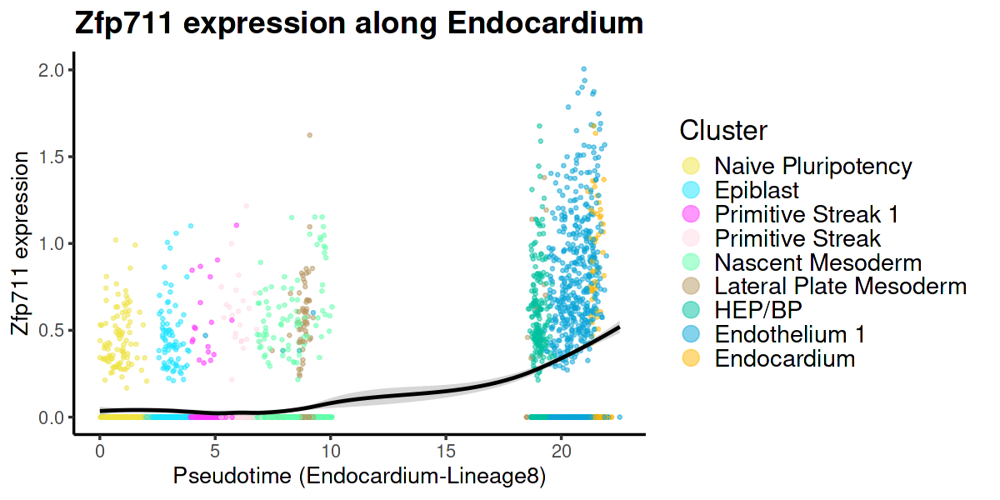

In [248]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage8",
  cluster_colors = colors,
  lineages = lineages
)

p

In [249]:
ggsave(filename = './figures/Zfp711_expression_along_Endocardium_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_Endocardium_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


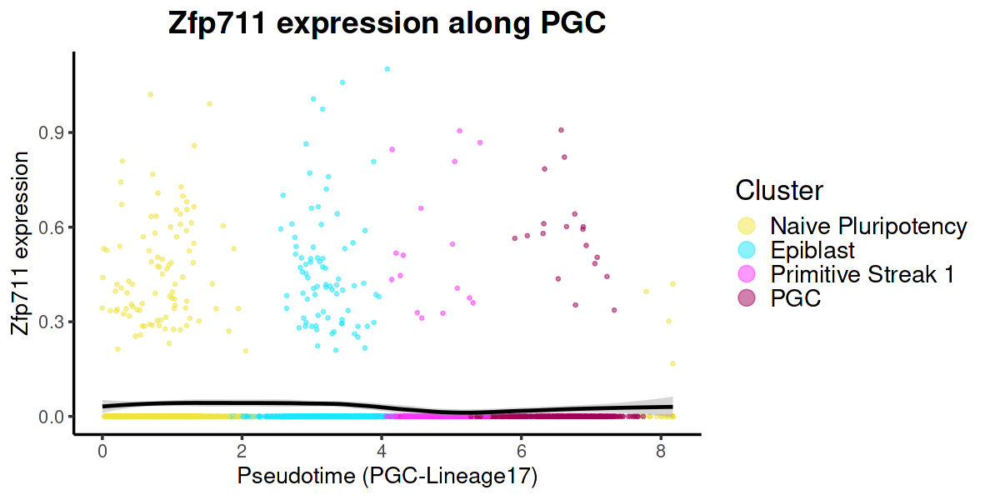

In [250]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage17",
  cluster_colors = colors,
  lineages = lineages
)

p

In [251]:
ggsave(filename = './figures/Zfp711_expression_along_PGC_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_PGC_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


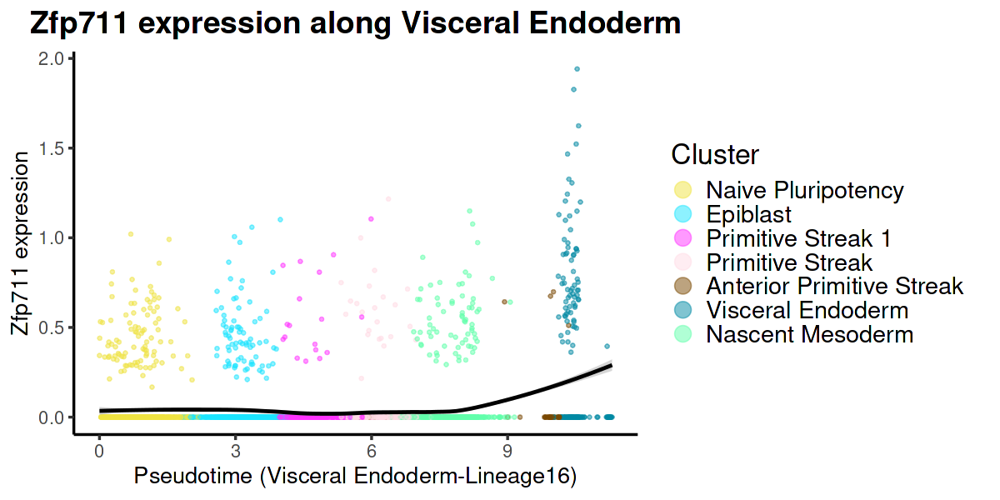

In [252]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage16",
  cluster_colors = colors,
  lineages = lineages
)

p

In [253]:
ggsave(filename = './figures/Zfp711_expression_along_visceral_endoderm_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_visceral_endoderm_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


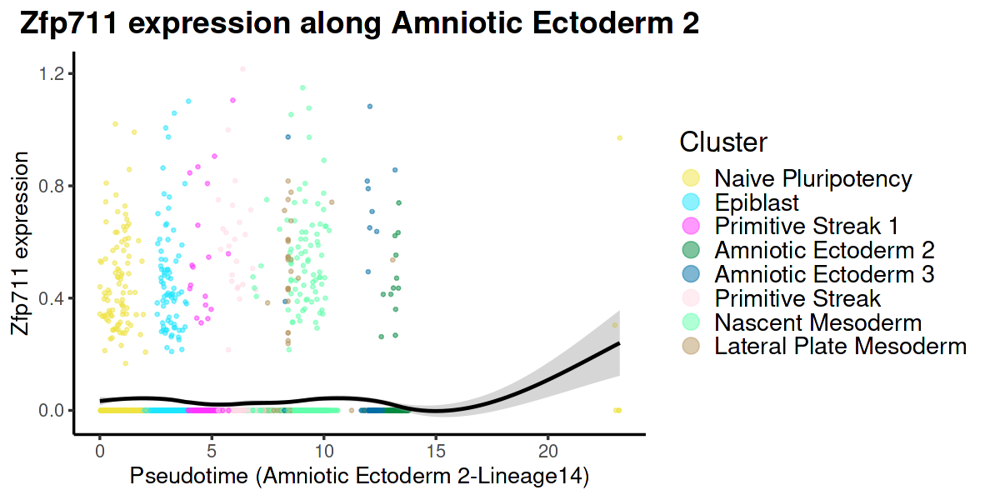

In [254]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage14",
  cluster_colors = colors,
  lineages = lineages
)

p

In [255]:
ggsave(filename = './figures/Zfp711_expression_along_amniotic_ectoderm_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_amniotic_ectoderm_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


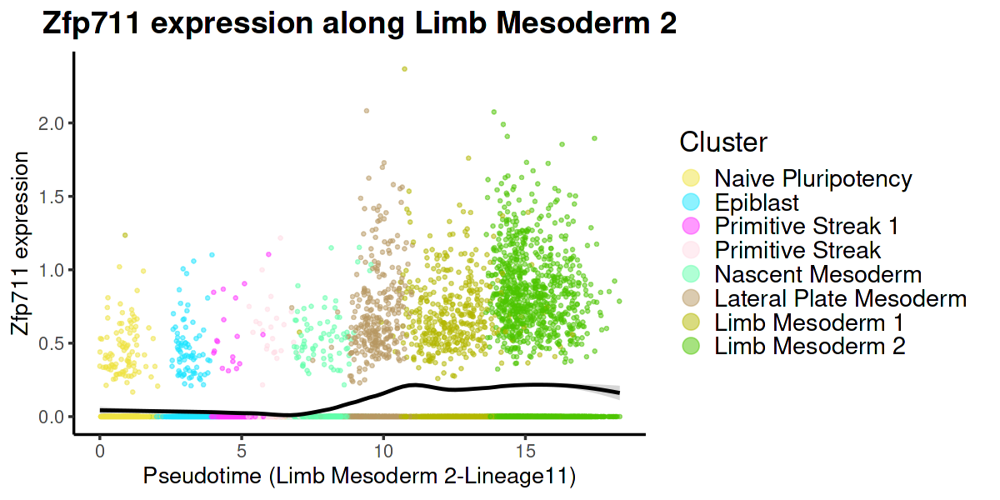

In [256]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage11",
  cluster_colors = colors,
  lineages = lineages
)

p

In [257]:
ggsave(filename = './figures/Zfp711_expression_along_limb_mesoderm_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_limb_mesoderm_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


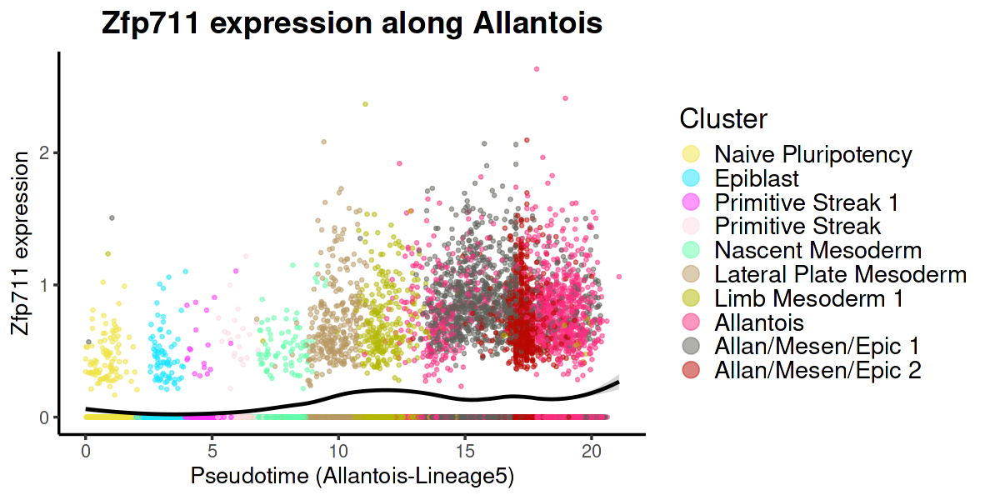

In [258]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage5",
  cluster_colors = colors,
  lineages = lineages
)

p

In [259]:
ggsave(filename = './figures/Zfp711_expression_along_allantois_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_allantois_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


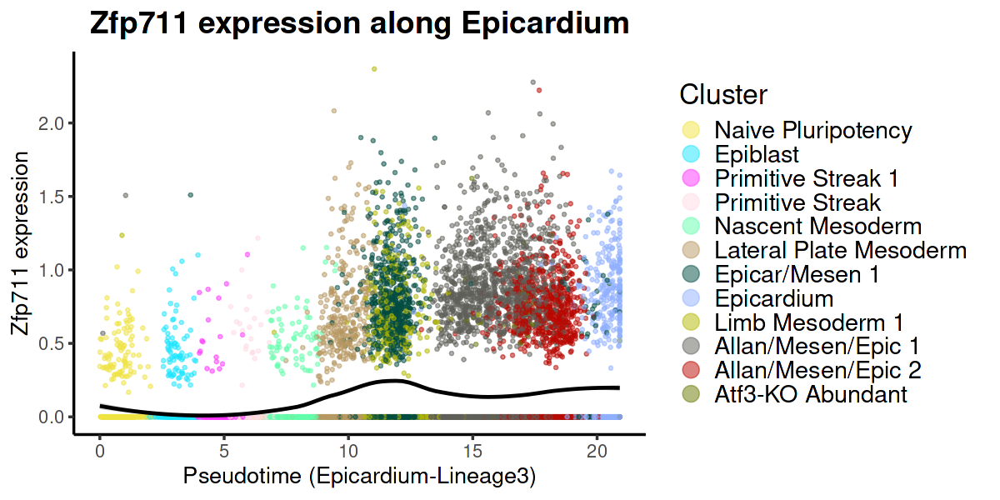

In [260]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage3",
  cluster_colors = colors,
  lineages = lineages
)

p

In [261]:
ggsave(filename = './figures/Zfp711_expression_along_epicardium_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_epicardium_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


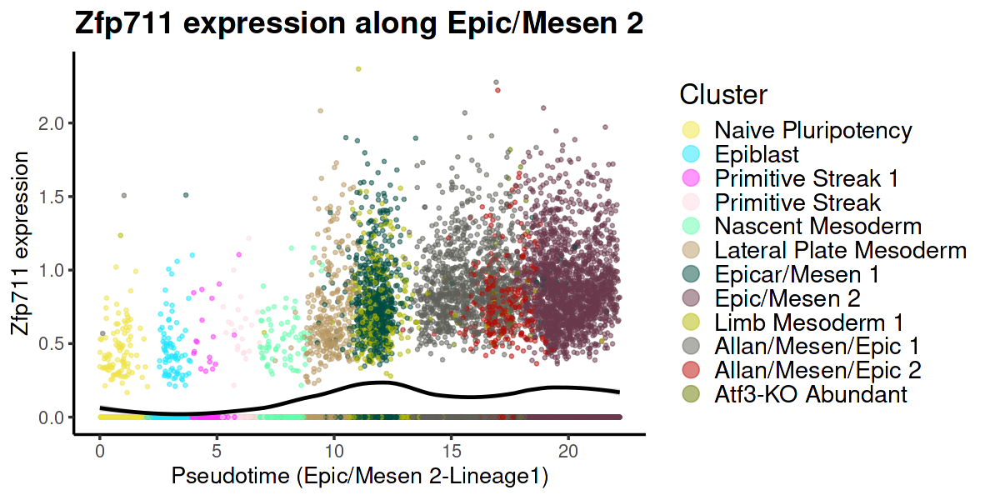

In [262]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage1",
  cluster_colors = colors,
  lineages = lineages
)

p

In [263]:
ggsave(filename = './figures/Zfp711_expression_along_Epicardium_mesenchyme2_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_Epicardium_mesenchyme2_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


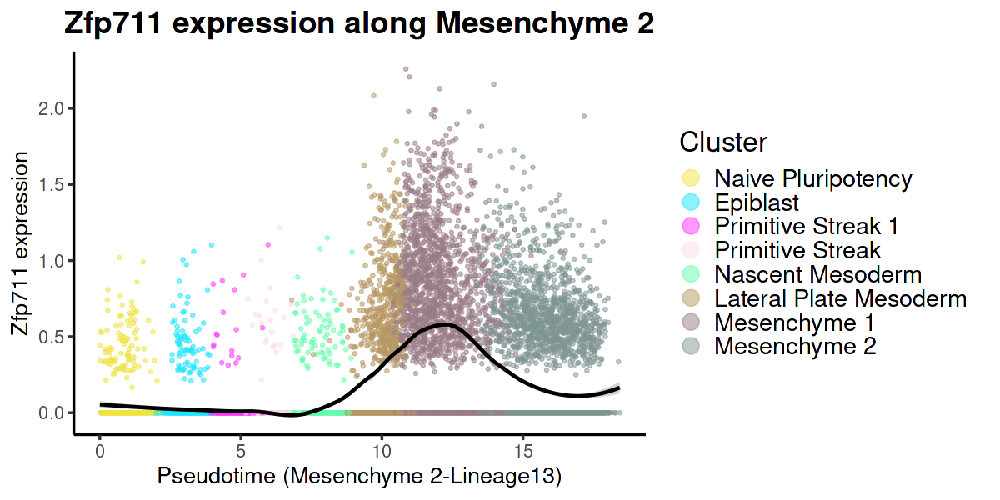

In [264]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage13",
  cluster_colors = colors,
  lineages = lineages
)

p

In [265]:
ggsave(filename = './figures/Zfp711_expression_along_Mesenchyme2_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_Mesenchyme2_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


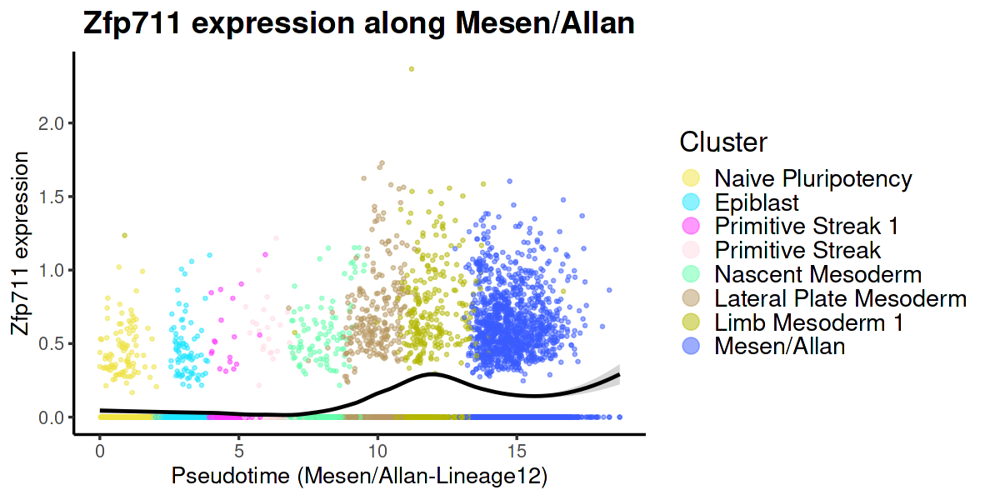

In [266]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Zfp711",
  lineage = "Lineage12",
  cluster_colors = colors,
  lineages = lineages
)

p

In [267]:
ggsave(filename = './figures/Zfp711_expression_along_Mesen_Allan_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Zfp711_expression_along_Mesen_Allan_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


### Bcl6b

`geom_smooth()` using formula = 'y ~ x'


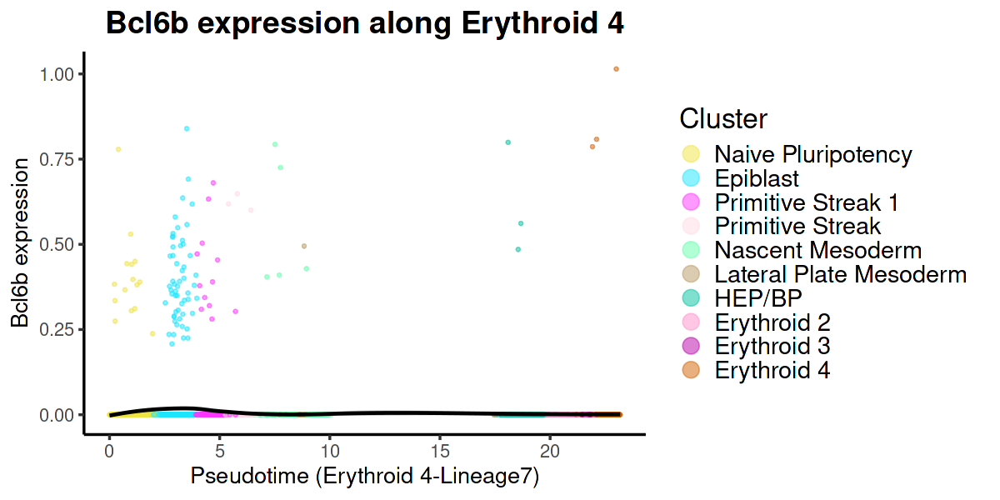

In [268]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage7",
  cluster_colors = colors,
  lineages = lineages
)

p

In [269]:
ggsave(filename = './figures/Bcl6b_expression_along_erythorid_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_erythorid_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


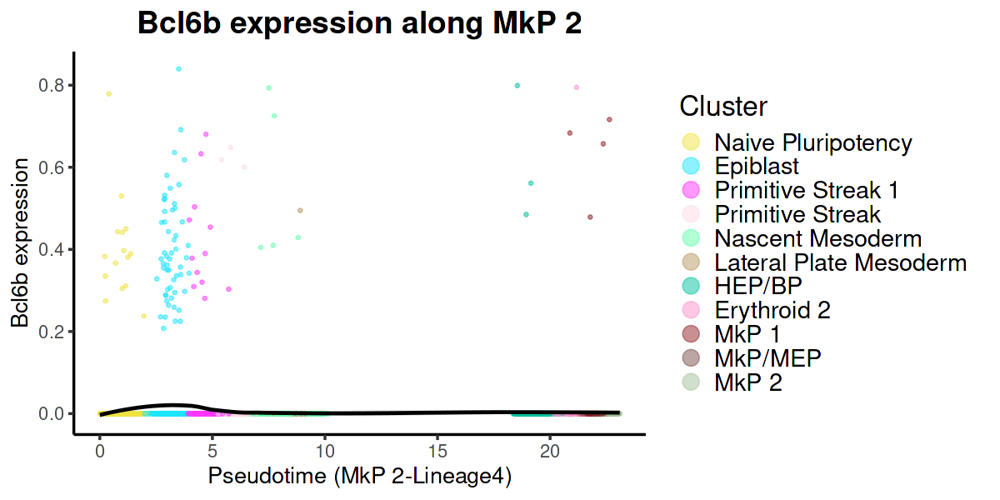

In [270]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage4",
  cluster_colors = colors,
  lineages = lineages
)

p

In [271]:
ggsave(filename = './figures/Bcl6b_expression_along_MkP_2_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_MkP_2_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


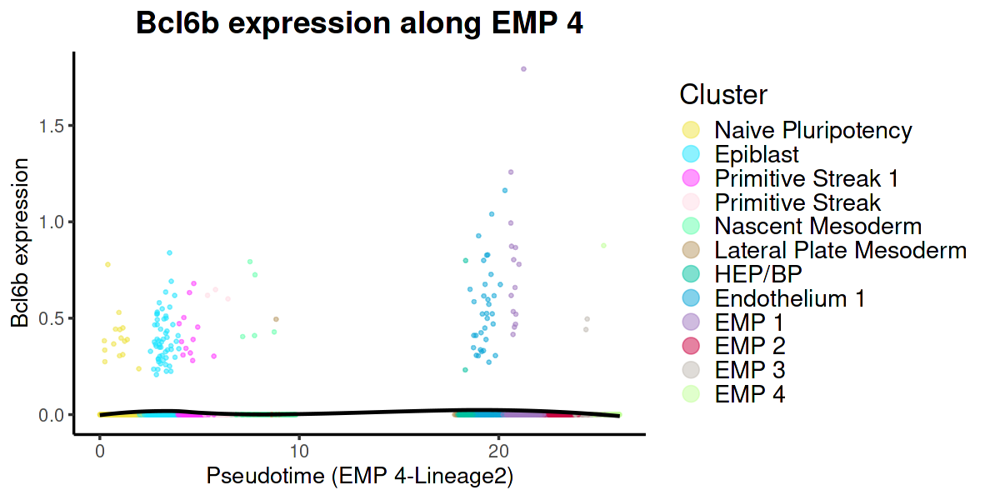

In [272]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage2",
  cluster_colors = colors,
  lineages = lineages
)

p

In [273]:
ggsave(filename = './figures/Bcl6b_expression_along_EMP_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_EMP_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


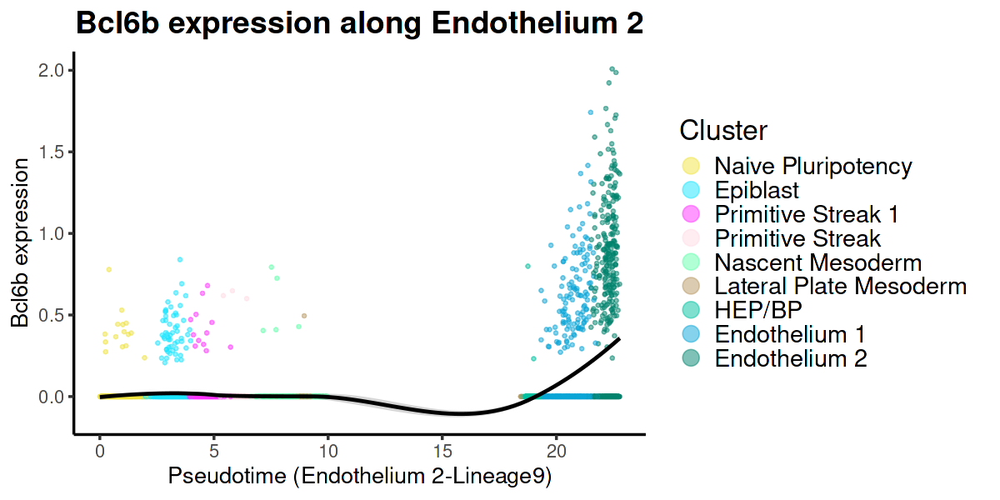

In [274]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage9",
  cluster_colors = colors,
  lineages = lineages
)

p

In [275]:
ggsave(filename = './figures/Atf3_expression_along_Endothelium_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Atf3_expression_along_Endothelium_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


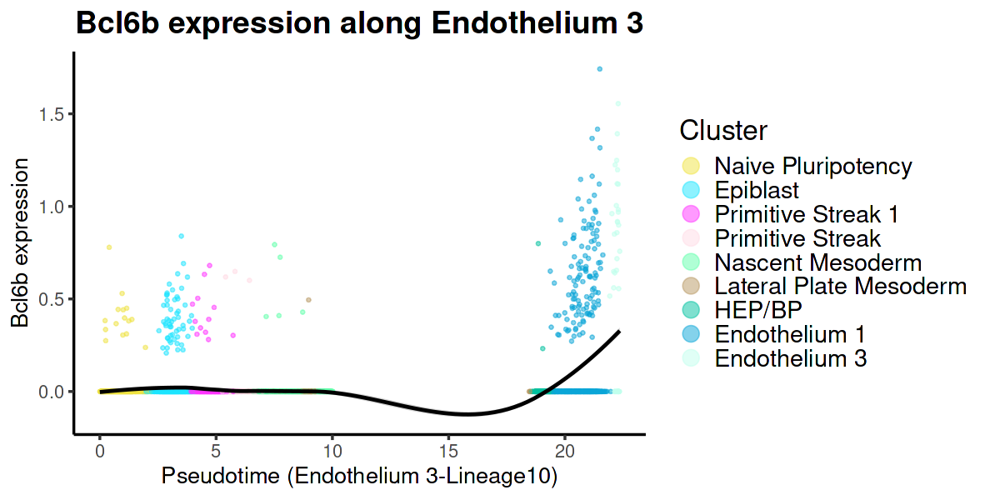

In [298]:
# ==============================================================================
# SECTION 12: BCL6B EXPRESSION ALONG LINEAGES
# ==============================================================================
# Plot Bcl6b expression vs pseudotime for each trajectory

options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage10",
  cluster_colors = colors,
  lineages = lineages
)

p

In [299]:
ggsave(filename = './figures/Bcl6b_expression_along_Endothelium_Rsad2_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_Endothelium_Rsad2_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


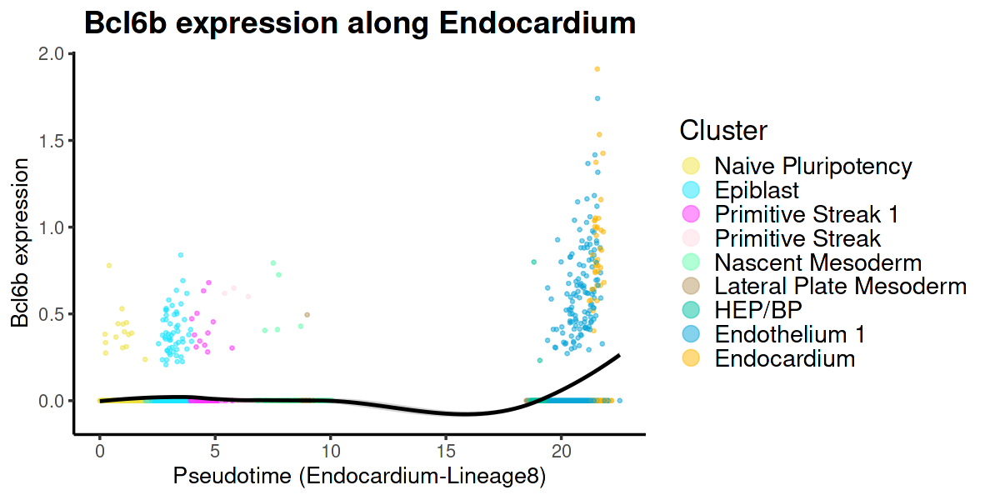

In [278]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage8",
  cluster_colors = colors,
  lineages = lineages
)

p

In [279]:
ggsave(filename = './figures/Bcl6b_expression_along_Endocardium_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_Endocardium_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


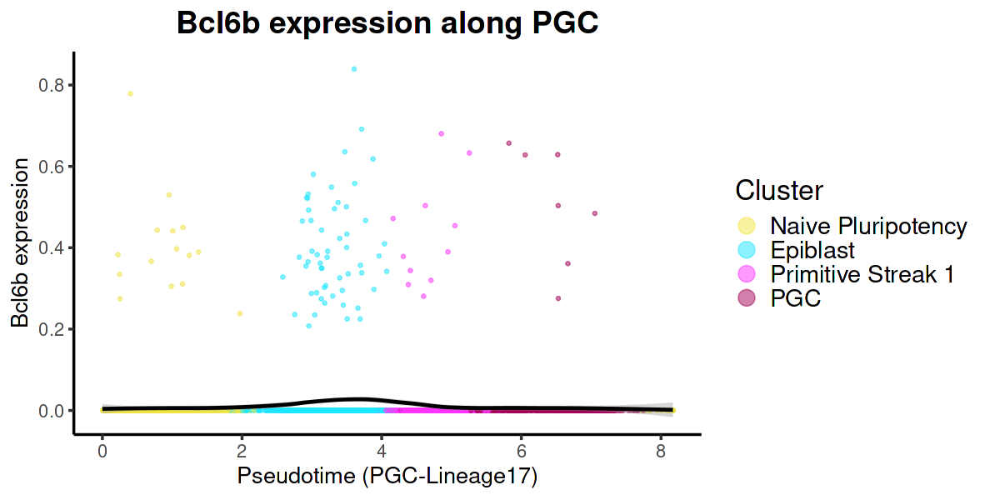

In [280]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage17",
  cluster_colors = colors,
  lineages = lineages
)

p

In [281]:
ggsave(filename = './figures/Bcl6b_expression_along_PGC_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_PGC_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


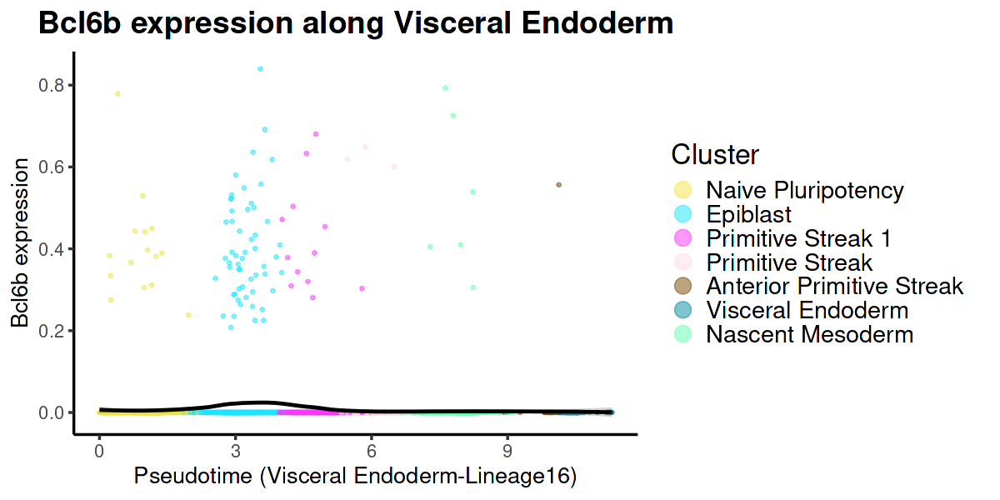

In [282]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage16",
  cluster_colors = colors,
  lineages = lineages
)

p

In [283]:
ggsave(filename = './figures/Bcl6b_expression_along_visceral_endoderm_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_visceral_endoderm_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


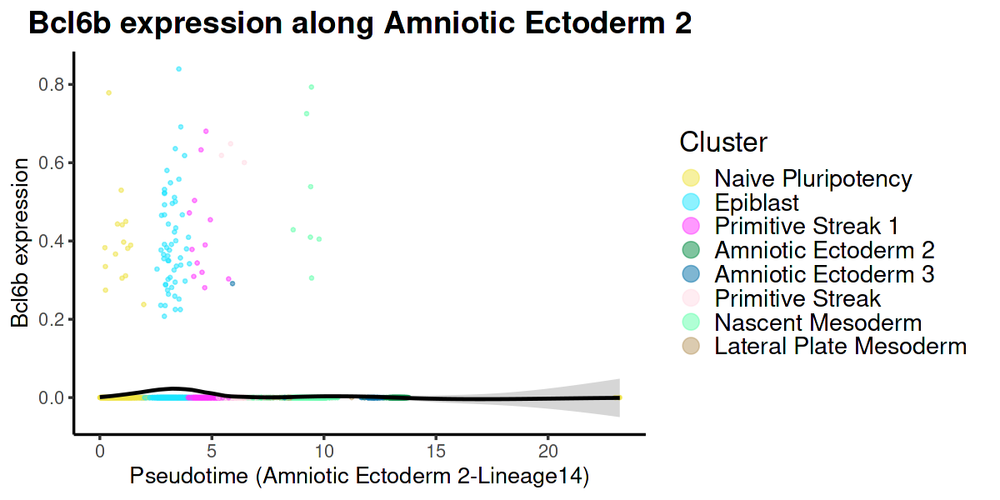

In [284]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage14",
  cluster_colors = colors,
  lineages = lineages
)

p

In [285]:
ggsave(filename = './figures/Bcl6b_expression_along_amniotic_ectoderm_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_amniotic_ectoderm_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


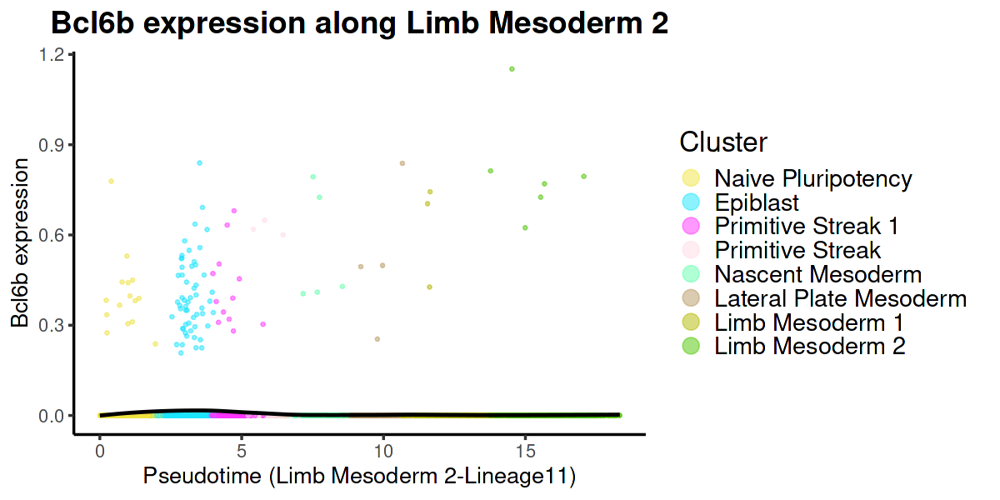

In [286]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage11",
  cluster_colors = colors,
  lineages = lineages
)

p

In [287]:
ggsave(filename = './figures/Bcl6b_expression_along_limb_mesoderm_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_limb_mesoderm_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


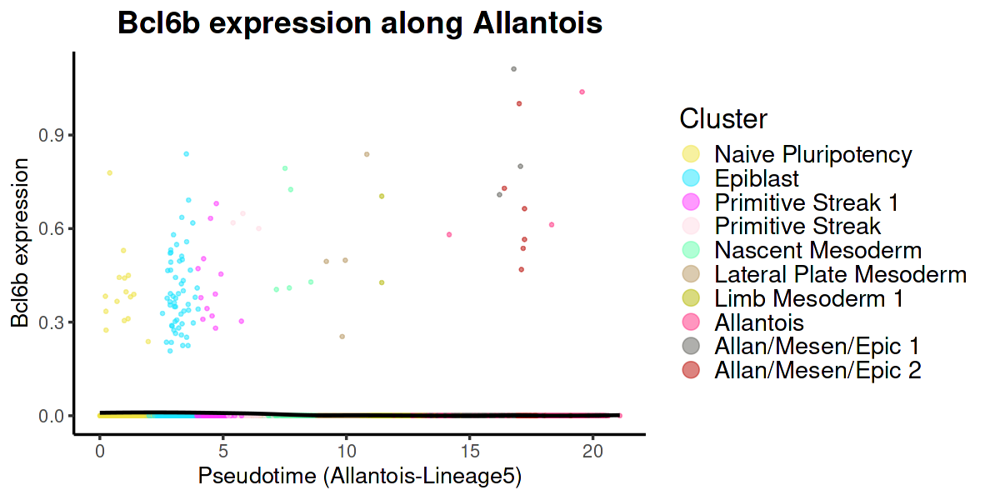

In [288]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage5",
  cluster_colors = colors,
  lineages = lineages
)

p

In [289]:
ggsave(filename = './figures/Bcl6b_expression_along_allantois_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_allantois_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


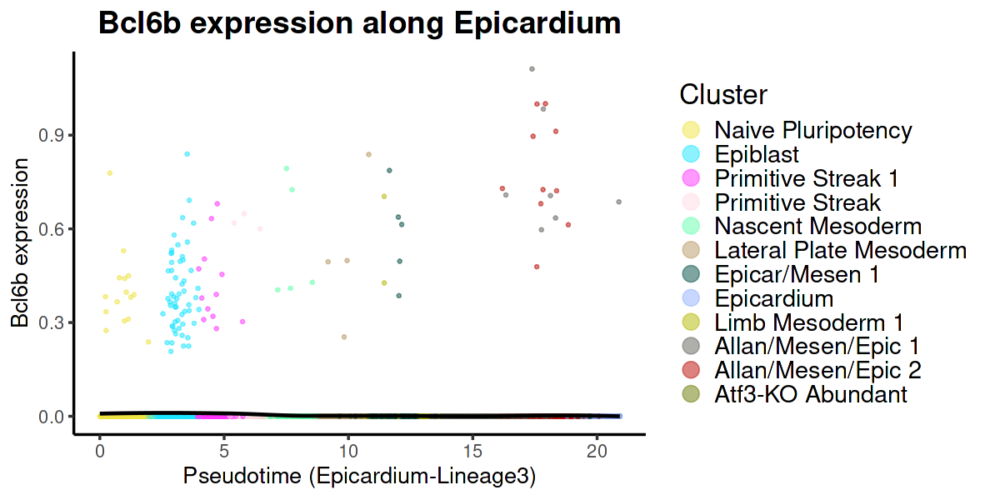

In [290]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage3",
  cluster_colors = colors,
  lineages = lineages
)

p

In [291]:
ggsave(filename = './figures/Bcl6b_expression_along_epicardium_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_epicardium_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


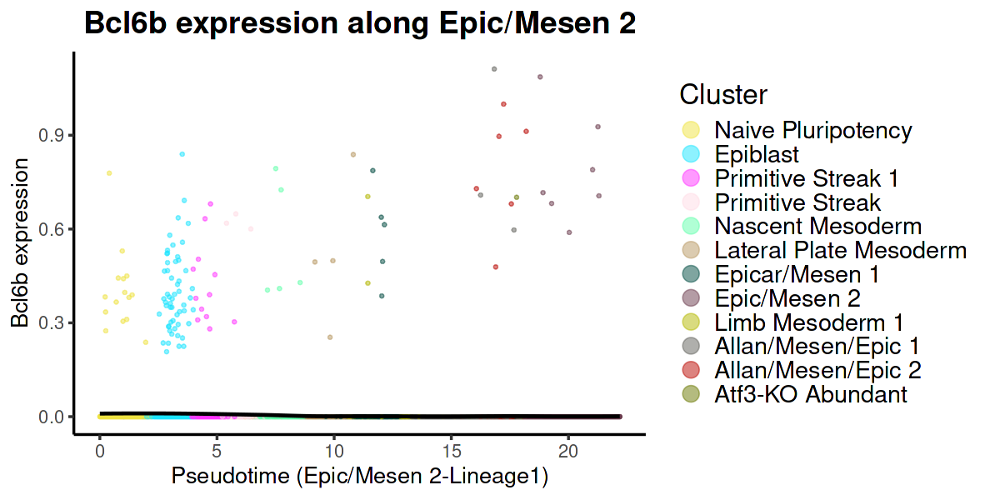

In [292]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage1",
  cluster_colors = colors,
  lineages = lineages
)

p

In [293]:
ggsave(filename = './figures/Bcl6b_expression_along_Epicardium_mesenchyme2_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_Epicardium_mesenchyme2_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


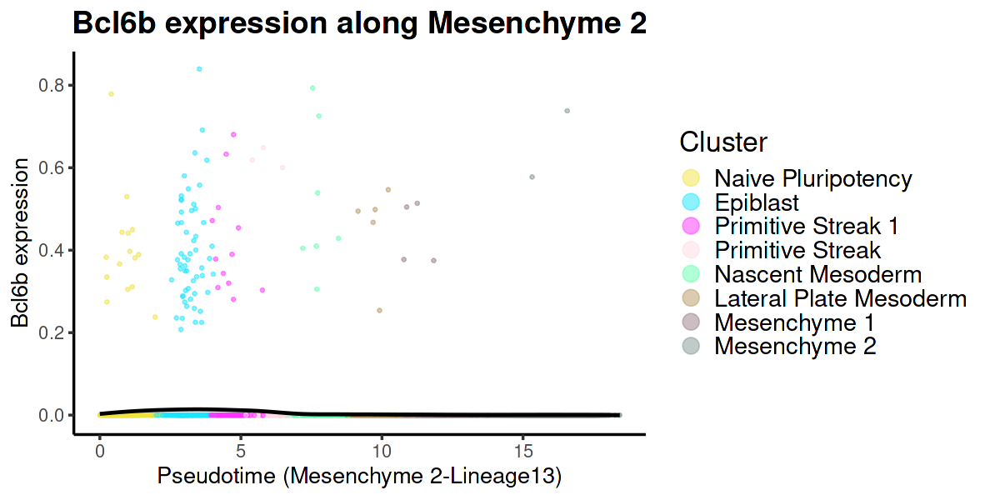

In [294]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage13",
  cluster_colors = colors,
  lineages = lineages
)

p

In [295]:
ggsave(filename = './figures/Bcl6b_expression_along_Mesenchyme2_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_Mesenchyme2_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


`geom_smooth()` using formula = 'y ~ x'


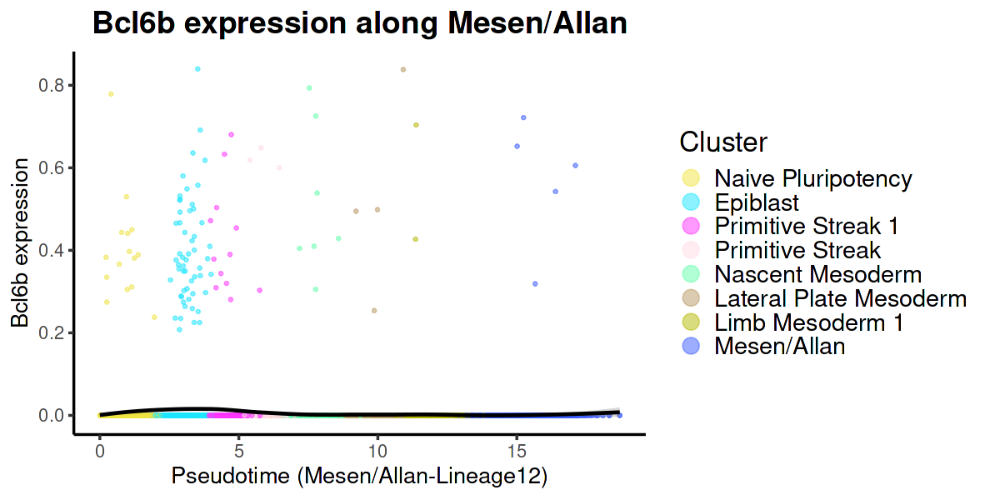

In [296]:
options(repr.plot.width = 10, repr.plot.height = 5)
p <- plot_gene_specific_lineage(
  obj = obj,
  pseudotime = pseudotime,
  cell_weights = cellWeights,
  gene = "Bcl6b",
  lineage = "Lineage12",
  cluster_colors = colors,
  lineages = lineages
)

p

In [297]:
ggsave(filename = './figures/Bcl6b_expression_along_Mesen_Allan_lineage.pdf', plot = p, width =10,  height = 5,units = 'in',dpi = 300)
ggsave(filename = './figures/Bcl6b_expression_along_Mesen_Allan_lineage.png', plot = p, width =10,  height = 5,units = 'in',dpi = 300)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


## save

In [336]:
ls()

[1] "bio_pkgs"                           "BPPARAM"                           
 [3] "cellWeights"                        "centroids2d"                       
 [5] "cluster_levels"                     "col_idx"                           
 [7] "colors"                             "curves"                            
 [9] "data_pkgs"                          "df"                                
[11] "ENDS"                               "fn_add_cellcycle_score"            
[13] "fn_clean_seurat"                    "fn_find_low_count_genes"           
[15] "fn_process_soupX"                   "fn_scDblFinder"                    
[17] "fn_soupx"                           "general_pkgs"                      
[19] "gv"                                 "imprint_genes"                     
[21] "io"                                 "lc"                                
[23] "lc.idx"                             "lineages"                          
[25] "mm"                                 "n_centroids"                       
[27] "n_labels"                           "o"                                 
[29] "obj"                                "opts"                              
[31] "p"                                  "p_State"                           
[33] "pal"                                "pal_viridis"                       
[35] "pkgs"                               "plot_gene_overall_pseudotime"      
[37] "plot_gene_specific_lineage"         "plot_gene_specific_lineage_barplot"
[39] "plot_gene_specific_lineage_boxplot" "plot_gene_specific_lineage_log"    
[41] "pseudotime"                         "r3dcol"                            
[43] "RegressOutMatrix"                   "RegressOutMatrix_parallel"         
[45] "sel_cells"                          "sel_genes"                         
[47] "viz_pkgs"                           "x"

In [341]:
# ==============================================================================
# SECTION 13: SAVE RESULTS
# ==============================================================================
# Export lineages and curves for downstream analysis

saveRDS(lineages, './lineages_cmo.rds')
saveRDS(curves, './curves_cmo.rds')

[1] 40